## 1. Data Wrangling

In [22]:
# Calculate number of documents in the Curation dataset
# and average number of words per document

import glob
import os
import pandas as pd
import json

wordtotal = 0
filenumber = 1 

for root, dirs, files in os.walk("./data/SVM topics/"):
    for dir in dirs:
        for file in glob.iglob(os.path.join("./data/SVM topics/", dir, "*.json")):
            with open(file) as f:
                json_article = pd.read_json(f, typ="series")
                content = json_article["content"]
                #for item in content:
                words = len(content.split())
                #increment variables
                wordtotal = wordtotal + words
                filenumber += 1 

wordaverage = wordtotal/filenumber

print("Average words per document = ", wordaverage)
print("Total number of documents = ", filenumber)

Average words per document =  92.83863181849527
Total number of documents =  43503


In [29]:
# Calculate number of documents in the raw dataset
# and average number of words per document

wordtotal = 0
filenumber = 1 

sourcedir = "training_jsons" 

for file in glob.iglob(os.path.join("./data/", sourcedir, "*.json")):
    with open(file) as f:
        json_article = pd.read_json(f, typ="series")
        content = json_article["content"]
        #for item in content:
        words = len(content.split())
        #increment variables
        wordtotal = wordtotal + words
        filenumber += 1 

wordaverage = wordtotal/filenumber

print("Average words per document = ", wordaverage)
print("Total number of documents = ", filenumber)

Average words per document =  343.7242860448039
Total number of documents =  198822


In [12]:
# Convert one Curation json file

%run json_converter "blockchain.json" "Blockchain"

Source file = blockchain.json
Target directory = Blockchain
Finished converting, took 3.8005268573760986


In [1]:
# Convert all classified Curation json files 

import os
import json_converter

directory = os.fsencode("./data/")

for file in os.listdir(directory):
    filename = os.fsdecode(file)
    if filename.endswith(".json"): 
        sourcefile = filename
        base = os.path.basename("./data/" + filename)
        targetdir = str(os.path.splitext(base)[0])
        print(sourcefile, targetdir)
        if not os.path.exists("./data/Topics/" + targetdir):
            os.makedirs("./data/Topics/" + targetdir)
        json_converter.json_converter(sourcefile, targetdir)
        continue
    else:
        continue


ai.json ai
Finished converting, took 2.9387080669403076
batterytech.json batterytech
Finished converting, took 12.21285104751587
blackswans.json blackswans
Finished converting, took 18.65738797187805
blockchain.json blockchain
Finished converting, took 6.958468914031982
carboneradication.json carboneradication
Finished converting, took 14.725329875946045
counterpartyrisk.json counterpartyrisk
Finished converting, took 24.09865093231201
digitalads.json digitalads
Finished converting, took 8.859638929367065
digitalcurrency.json digitalcurrency
Finished converting, took 11.66473913192749
digitalhealth.json digitalhealth
Finished converting, took 8.87488317489624
educationtech.json educationtech
Finished converting, took 6.239595174789429
financialservices.json financialservices
Finished converting, took 15.304985761642456
internetofthings.json internetofthings
Finished converting, took 10.014711141586304
property.json property
Finished converting, took 9.489853858947754
sharingeconomy.jso

In [2]:
# Convert unclassified articles from xml to json

%run xml_converter "xml_source_sample" "Unclassified"

Source file = xml_source_sample
Target directory = Unclassified
Finished converting, took 12.327651977539062


## 2. Finding a Language Model, 3. Similarity Queries

### Bag of Words (bow)

In [17]:
# Create one bow corpus, in AI

%run create_bow_corpus ai

Source directory = ai
Corpus is stored in ai

Cleaned and lemmatized corpus texts:

 [['Data', 'show', 'US', 'manufacture', 'robot', 'trade', 'deficit', '4.1bn', 'The', 'US', 'lag', 'behind', 'production', 'cutting-edge', 'manufacture', 'robot', 'run', 'trade', 'deficit', '4.1bn', 'compare', 'Japan', 'European', 'Union', 'Switzerland', 'accord', 'US', 'Commerce', 'Department', 'data', 'The', 'issue', 'force', 'US', 'business', 'look', 'abroad', 'machinery', 'despite', 'many', 'wish', 'buy', 'American', 'The', '``', 'hard', 'truth', "''", 'US', 'trail', 'behind', 'wealthy', 'country', 'come', 'manufacture', 'innovation', 'accord', '2012', 'report', 'then-President', 'Barack', 'Obama', 'In', '1995', 'US', 'firm', 'satisfy', '81', 'domestic', 'demand', 'factory', 'equipment', 'number', 'slip', '63', '2015', 'accord', 'Germany’s', 'VDMA', 'industrial-machinery', 'trade', 'group', '/p'], ['Folding', 'robot', 'could', 'reach', 'part', 'Mars', 'rover', 'ca', "n't", 'An', 'origami-inspired', '

In [2]:
# Create bow corpuses in all the topic categories

import os
import create_bow_corpus

directory = os.fsencode("./data/Topics/")

for subdirectory in os.listdir(directory):
    subdirectoryname = os.fsdecode(subdirectory)
    if not subdirectoryname == ".DS_Store":
        print(subdirectoryname)
        create_bow_corpus.create_bow_corpus(subdirectoryname)


ai
Dictionary: Dictionary(2740 unique tokens: ['Data', 'show', 'US', 'manufacture', 'robot']...) 

batterytech
Dictionary: Dictionary(4719 unique tokens: ['Tesla', 'Australia', 'battery', 'plan', 'open']...) 

blackswans
Dictionary: Dictionary(6567 unique tokens: ['Low', 'rate', 'Japanese', 'bankruptcy', 'may']...) 

blockchain
Dictionary: Dictionary(2472 unique tokens: ['coin', 'offering', 'seek', 'funding', 'apps']...) 

carboneradication
Dictionary: Dictionary(4347 unique tokens: ['Tesla', 'Australia', 'battery', 'plan', 'open']...) 

counterpartyrisk
Dictionary: Dictionary(5503 unique tokens: ['HSBC', 'appoint', 'new', 'chairman', 'Mark']...) 

digitalads
Dictionary: Dictionary(3346 unique tokens: ['41', 'Wall', 'Street', 'analyst', 'rate']...) 

digitalcurrency
Dictionary: Dictionary(2666 unique tokens: ['Mastercard', 'allow', 'customer', 'make', 'payment']...) 

digitalhealth
Dictionary: Dictionary(2888 unique tokens: ['raise', '1.5m', 'prescribe', 'antidepressant', 'AI']...) 

e

### Tfidf

In [6]:
%run create_tfidf_corpus ai

Source directory = ai
Corpus is stored in ai
Finished corpus and dictionary creation, took 0.9358720779418945


In [20]:
# Create tfidf models in all the topic categories

import os
import create_tfidf_corpus

directory = os.fsencode("./data/Topics/")

for subdirectory in os.listdir(directory):
    subdirectoryname = os.fsdecode(subdirectory)
    if not subdirectoryname == ".DS_Store":
        print(subdirectoryname)
        create_tfidf_corpus.create_tfidf_corpus(subdirectoryname)
        

ai
Finished corpus and dictionary creation, took 0.8963868618011475
batterytech
Finished corpus and dictionary creation, took 2.997584104537964
blackswans
Finished corpus and dictionary creation, took 4.112277030944824
blockchain
Finished corpus and dictionary creation, took 0.946660041809082
carboneradication
Finished corpus and dictionary creation, took 2.206144094467163
counterpartyrisk
Finished corpus and dictionary creation, took 2.7461211681365967
digitalads
Finished corpus and dictionary creation, took 1.362210750579834
digitalcurrency
Finished corpus and dictionary creation, took 0.8389129638671875
digitalhealth
Finished corpus and dictionary creation, took 1.0206120014190674
educationtech
Finished corpus and dictionary creation, took 0.7330002784729004
financialservices
Finished corpus and dictionary creation, took 1.9026129245758057
internetofthings
Finished corpus and dictionary creation, took 1.0813181400299072
property
Finished corpus and dictionary creation, took 1.689975

Source directory for corpus is ./data/Topics/ai
Sample jsons are taken from ./data/Topics sample/ai
Chosen language model is bow

bow comparison

Sample file 1 is 100% similar to corpus test file 1
Sample file 2 is 99% similar to corpus test file 2
Sample file 3 is 99% similar to corpus test file 3
Sample file 4 is 100% similar to corpus test file 4
Sample file 5 is 99% similar to corpus test file 5
Sample file 6 is 100% similar to corpus test file 6
Sample file 7 is 100% similar to corpus test file 7
Sample file 8 is 99% similar to corpus test file 8
Sample file 9 is 100% similar to corpus test file 9
Sample file 10 is 100% similar to corpus test file 10




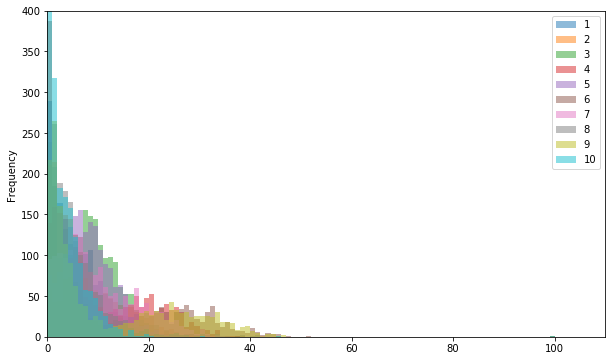

Finished bow comparison, took 15.203305959701538


In [4]:
%run plot_comparison "ai" "ai" "bow"

Source directory for corpus is ./data/Topics/ai
Sample jsons are taken from ./data/Topics sample/ai
Chosen language model is tfidf

tfidf comparison

Sample file 1 is 100% similar to corpus test file 1
Sample file 2 is 100% similar to corpus test file 2
Sample file 3 is 100% similar to corpus test file 3
Sample file 4 is 100% similar to corpus test file 4
Sample file 5 is 100% similar to corpus test file 5
Sample file 6 is 100% similar to corpus test file 6
Sample file 7 is 100% similar to corpus test file 7
Sample file 8 is 100% similar to corpus test file 8
Sample file 9 is 100% similar to corpus test file 9
Sample file 10 is 100% similar to corpus test file 10




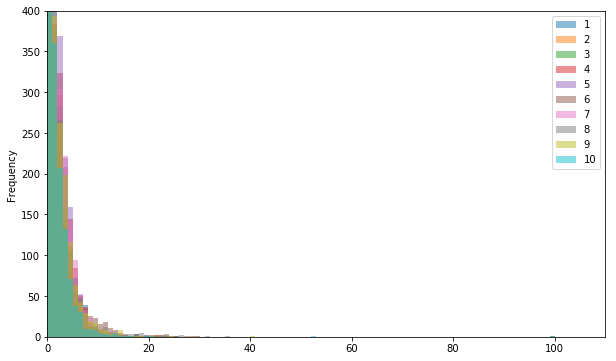

Finished tfidf comparison, took 17.97617816925049


In [7]:
%run plot_comparison "ai" "ai" "tfidf"

In [2]:
# Copy 10 sample files into Topics samples directories

import shutil
import glob

def copyFile(src, dest):
    shutil.copy(src, dest)

filenumber = 0 
directory = os.fsencode("./data/Topics/")

for subdirectory in os.listdir(directory):
    subdirectoryname = os.fsdecode(subdirectory)
    filenumber = 0 
    
    if not subdirectoryname == ".DS_Store":
        print(subdirectoryname)
        if not os.path.exists("./data/Topics sample/" + subdirectoryname):
            os.makedirs("./data/Topics sample/" + subdirectoryname)
        
        for file in glob.iglob(os.path.join("./data/Topics/", subdirectoryname, "*.json")): 
            filenumber += 1
            src = file #os.path.join("./data/Topics/", subdirectoryname, file)
            dest = os.path.join("./data/Topics sample/", subdirectoryname)
            copyFile(src, dest)
            if filenumber == 10:
                break
  

ai
batterytech
blackswans
blockchain
carboneradication
counterpartyrisk
digitalads
digitalcurrency
digitalhealth
educationtech
financialservices
internetofthings
property
sharingeconomy


AI

bow comparison



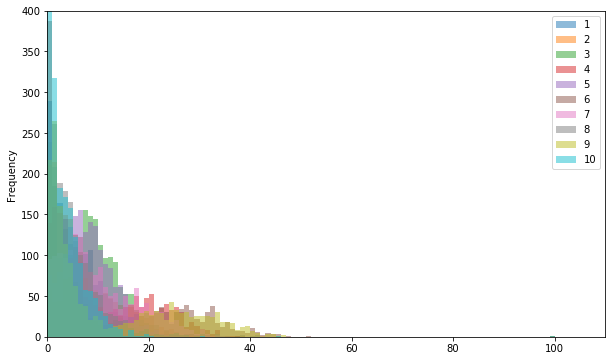

Finished bow comparison, took 41.32511591911316

tfidf comparison



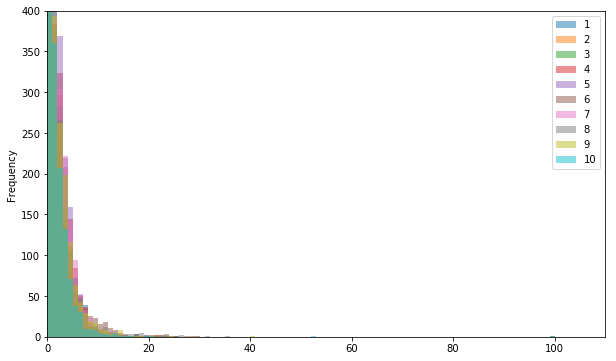

Finished tfidf comparison, took 27.31586217880249



BATTERYTECH

bow comparison



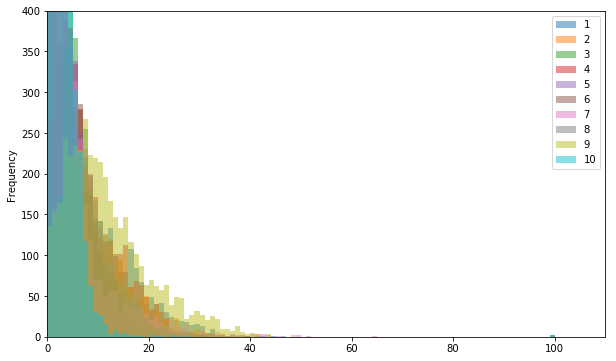

Finished bow comparison, took 44.190157890319824

tfidf comparison



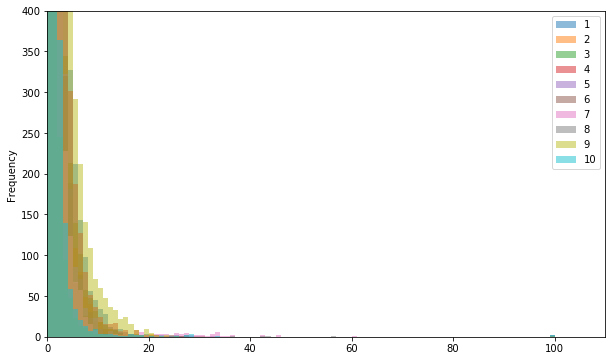

Finished tfidf comparison, took 77.95515203475952



BLACKSWANS

bow comparison



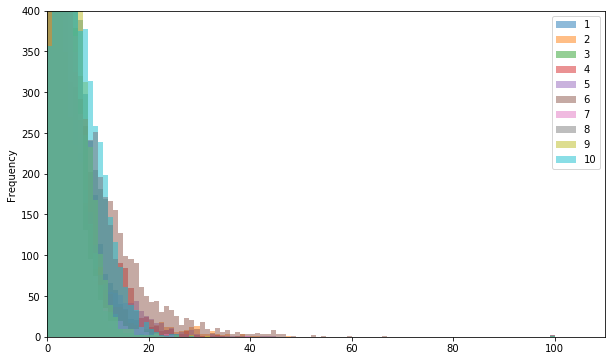

Finished bow comparison, took 72.51316785812378

tfidf comparison



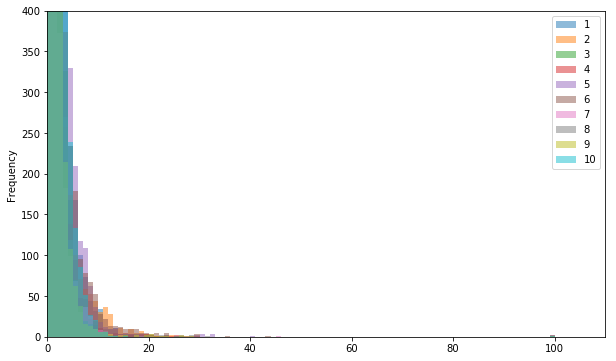

Finished tfidf comparison, took 69.77268695831299



BLOCKCHAIN

bow comparison



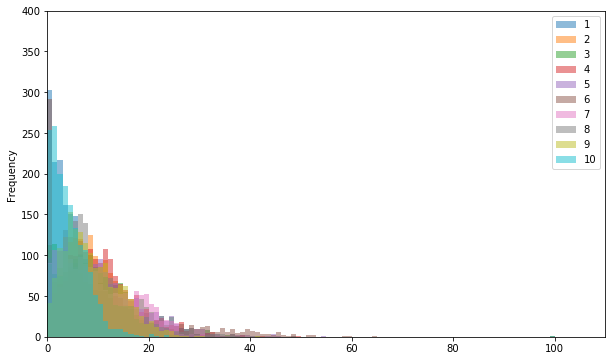

Finished bow comparison, took 17.538951873779297

tfidf comparison



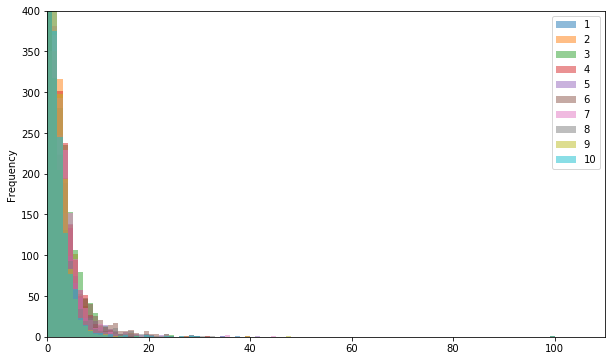

Finished tfidf comparison, took 18.994437217712402



CARBONERADICATION

bow comparison



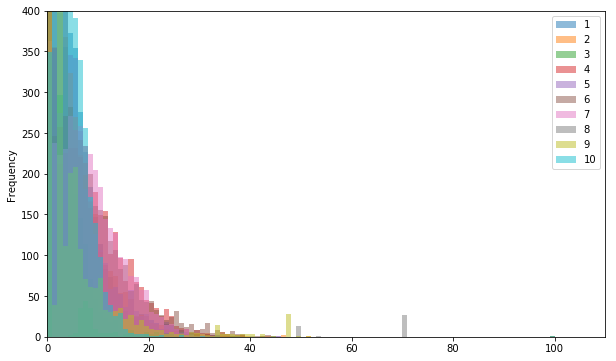

Finished bow comparison, took 30.547139883041382

tfidf comparison



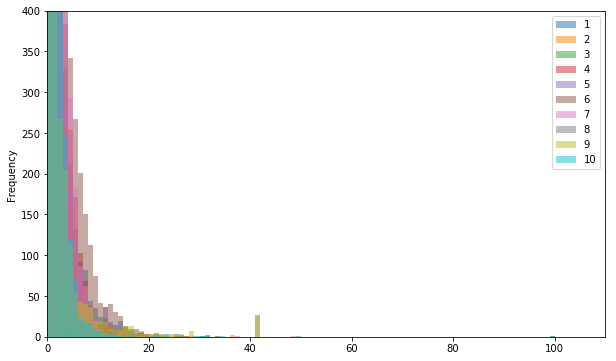

Finished tfidf comparison, took 37.4817328453064



COUNTERPARTYRISK

bow comparison



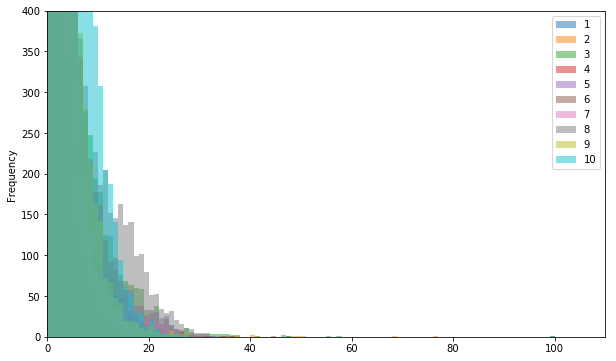

Finished bow comparison, took 43.11108207702637

tfidf comparison



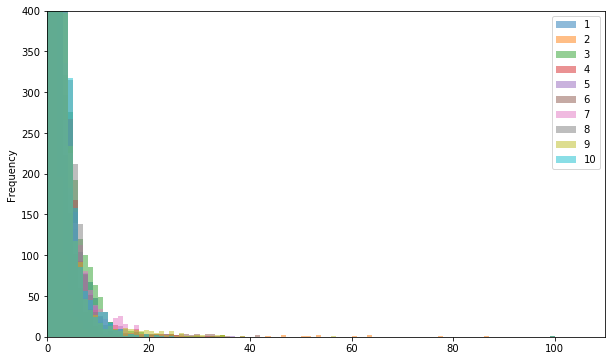

Finished tfidf comparison, took 55.00275278091431



DIGITALADS

bow comparison



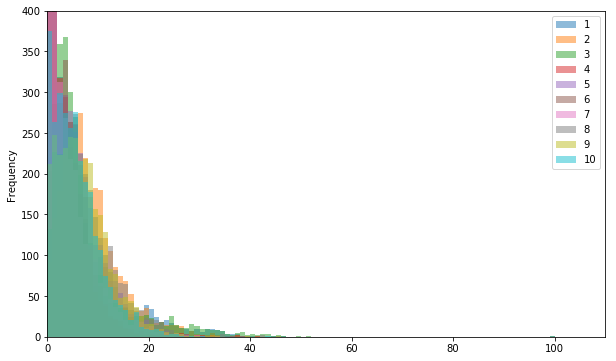

Finished bow comparison, took 27.14961004257202

tfidf comparison



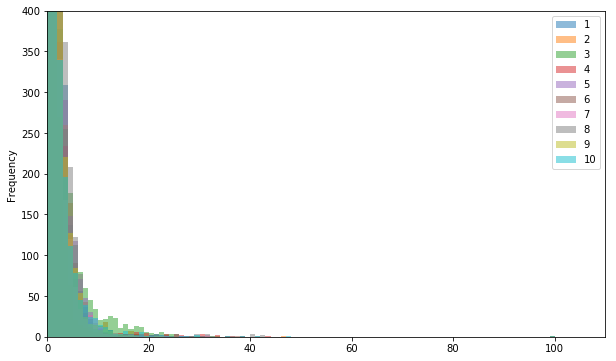

Finished tfidf comparison, took 31.01471519470215



DIGITALCURRENCY

bow comparison



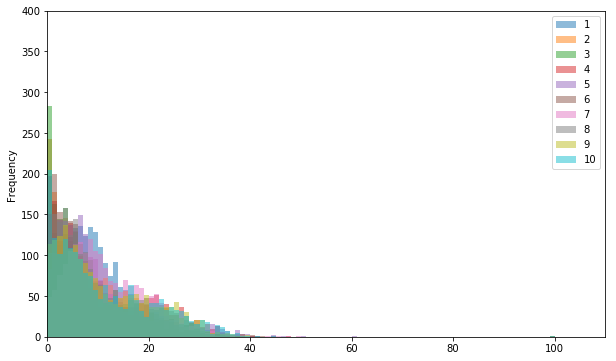

Finished bow comparison, took 20.299784183502197

tfidf comparison



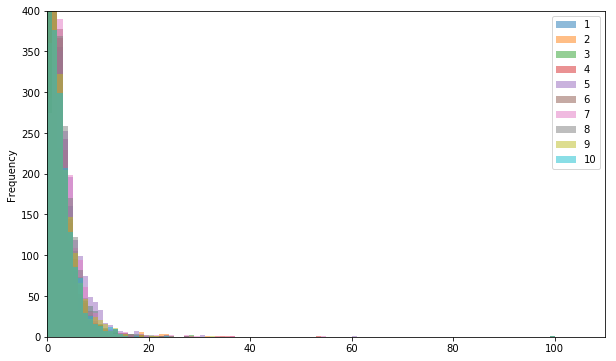

Finished tfidf comparison, took 22.058221101760864



DIGITALHEALTH

bow comparison



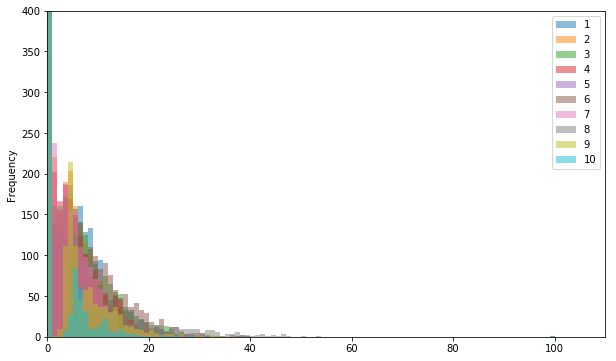

Finished bow comparison, took 40.36815786361694

tfidf comparison



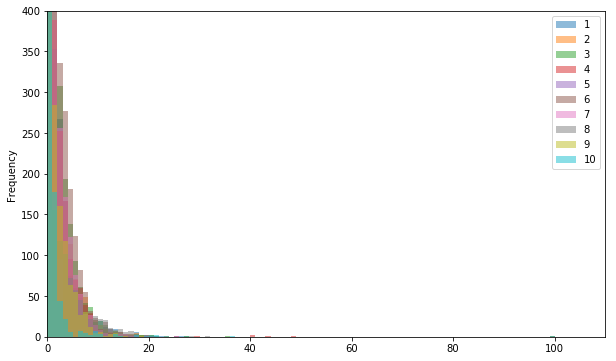

Finished tfidf comparison, took 46.132599115371704



EDUCATIONTECH

bow comparison



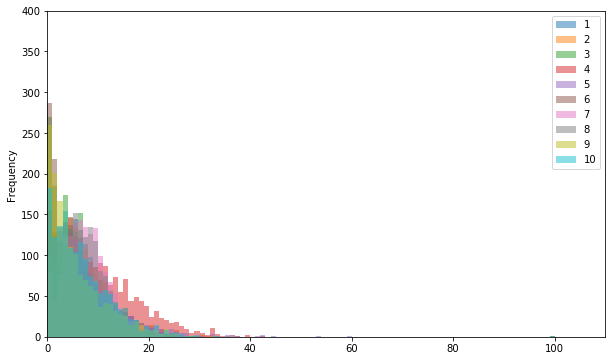

Finished bow comparison, took 42.07365083694458

tfidf comparison



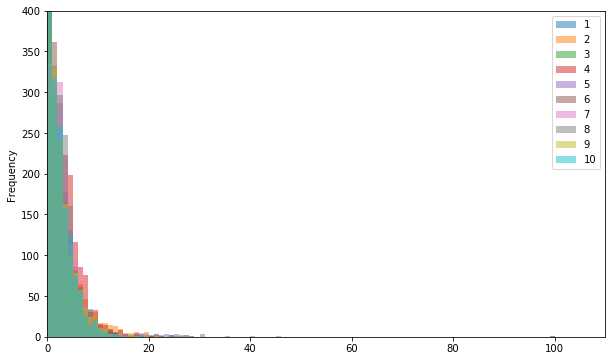

Finished tfidf comparison, took 53.750653982162476



FINANCIALSERVICES

bow comparison



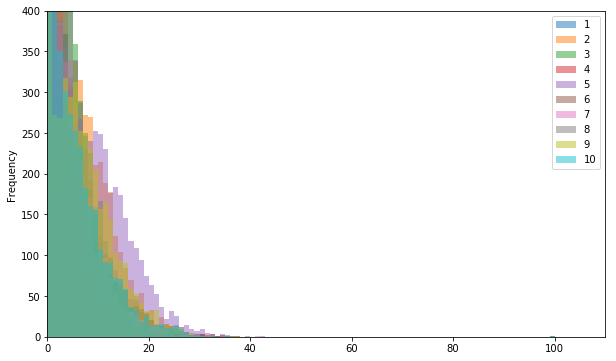

Finished bow comparison, took 73.95915102958679

tfidf comparison



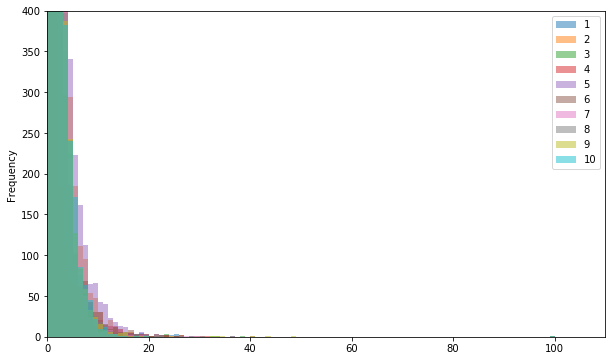

Finished tfidf comparison, took 95.12934279441833



INTERNETOFTHINGS

bow comparison



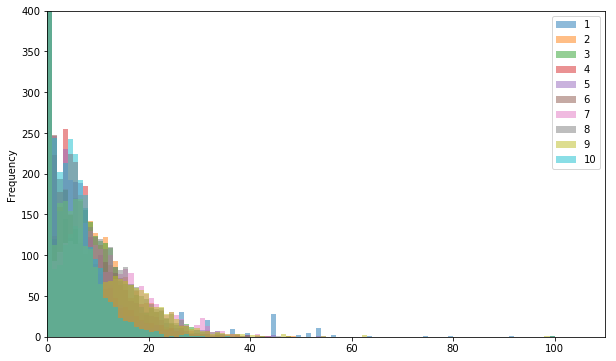

Finished bow comparison, took 41.326125144958496

tfidf comparison



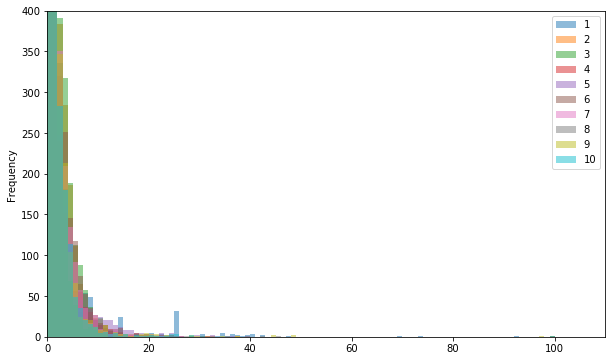

Finished tfidf comparison, took 42.59201669692993



PROPERTY

bow comparison



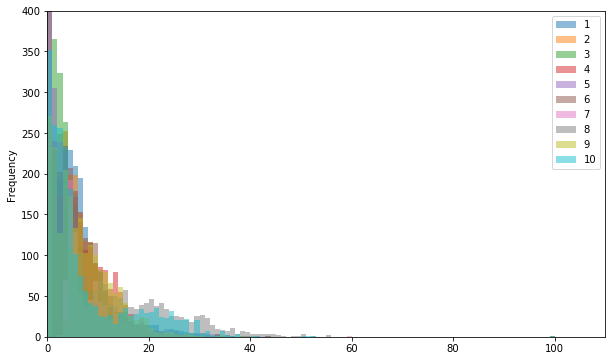

Finished bow comparison, took 37.62886714935303

tfidf comparison



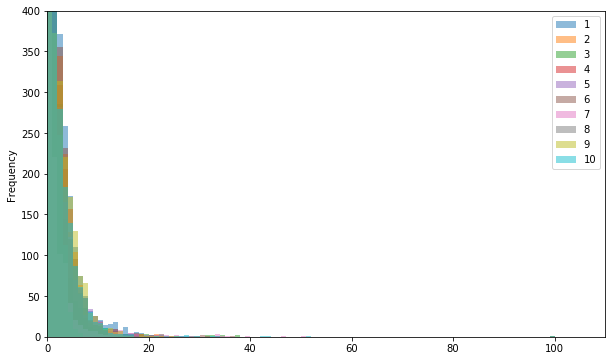

Finished tfidf comparison, took 95.67946696281433



SHARINGECONOMY

bow comparison



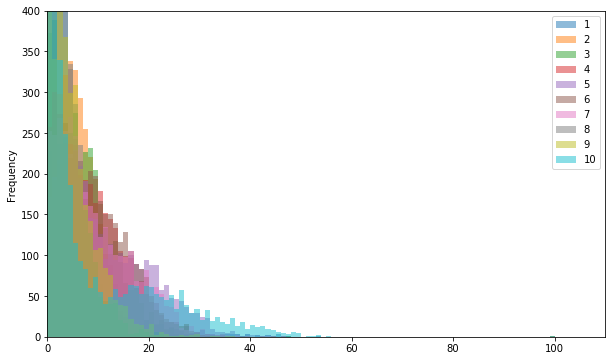

Finished bow comparison, took 37.55722212791443

tfidf comparison



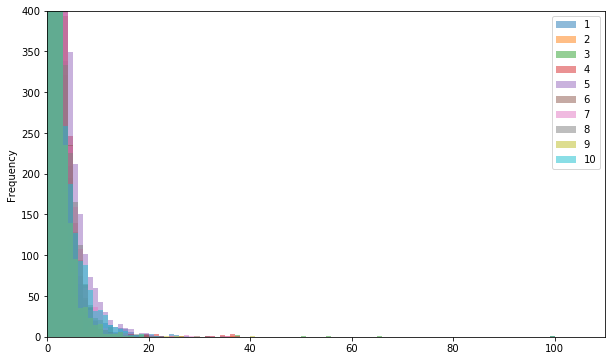

Finished tfidf comparison, took 42.08241891860962





In [1]:
# Comparing bow distributions to tdidf distributions across all topics.
# Note that I've suppressed the list of top matches here, to focus 
# on the histograms

import os
import plot_comparison

directory = os.fsencode("./data/Topics/")

for subdirectory in os.listdir(directory):
    subdirectoryname = os.fsdecode(subdirectory)
    filenumber = 0 
    
    if not subdirectoryname == ".DS_Store":
        print(str.upper(subdirectoryname))
        plot_comparison.plot_comparison(subdirectoryname, subdirectoryname, "bow")
        plot_comparison.plot_comparison(subdirectoryname, subdirectoryname, "tfidf")
        print("\n\n")

All the histograms show the same effect: tdidf comparisons show markedly lower cosine similarity scores, except on exact matches, where they score 100%. We'd expect this: by filtering/weighting for more frequent words, tfidf will remove many false positives that will be thrown up by the more broadly defined bag-of-words corpus. 

We can now compare the topic samples with the corpuses created from the other topics.

Source directory for corpus is ./data/Topics/ai
Sample jsons are taken from ./data/Topics sample/blockchain
Chosen language model is tfidf

tfidf comparison



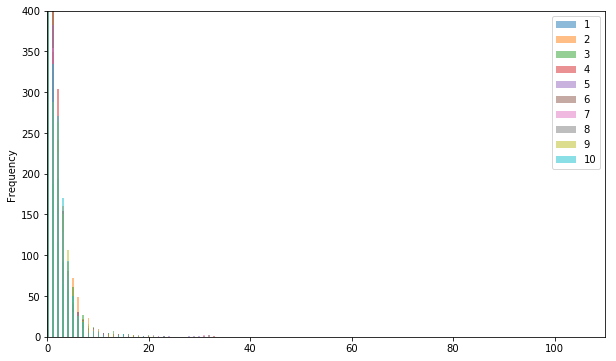

Finished tfidf comparison, took 20.477082014083862


In [3]:
%run plot_comparison "ai" "blockchain" "tfidf"

Source directory for corpus is ./data/Topics/ai
Sample jsons are taken from ./data/Topics sample/counterpartyrisk
Chosen language model is tfidf

tfidf comparison



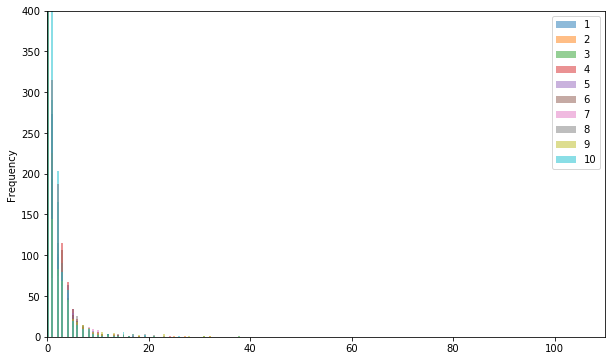

Finished tfidf comparison, took 23.625030040740967


In [4]:
%run plot_comparison "ai" "counterpartyrisk" "tfidf"

Source directory for corpus is ./data/Topics/ai
Sample jsons are taken from ./data/Topics sample/digitalhealth
Chosen language model is tfidf

tfidf comparison



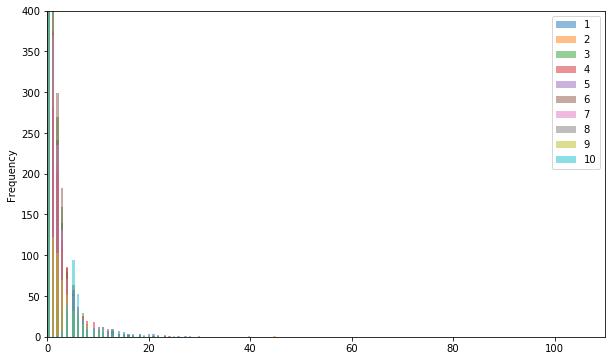

Finished tfidf comparison, took 32.84551382064819


In [5]:
%run plot_comparison "ai" "digitalhealth" "tfidf"

Source directory for corpus is ./data/Topics/ai
Sample jsons are taken from ./data/Topics sample/property
Chosen language model is tfidf

tfidf comparison



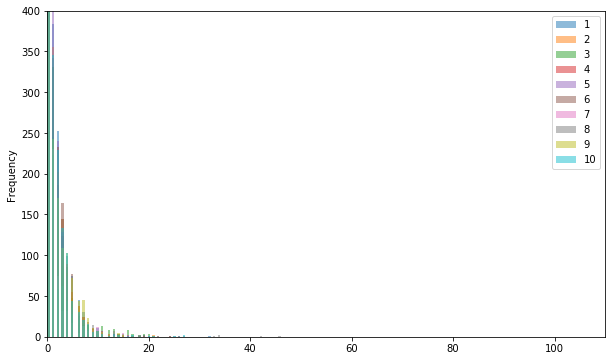

Finished tfidf comparison, took 36.04057812690735


In [6]:
%run plot_comparison "ai" "property" "tfidf"

We can see from the sequence above, for example, that the sample of 10 blockchain stories has more in common with AI than the samples from Digital Health, Counterparty Risk, or Property.

Source directory for corpus is ./data/Topics/ai
Sample jsons are taken from ./data/Topics sample/unclassified
Chosen language model is tfidf

tfidf comparison



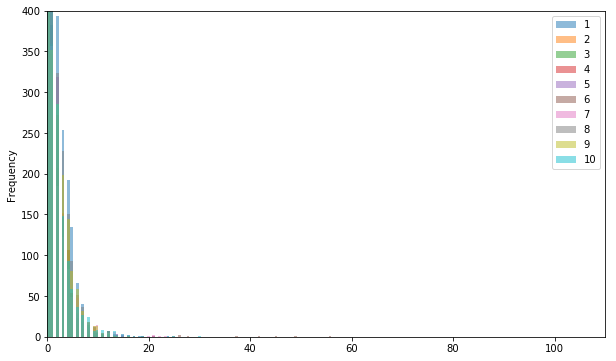

Finished tfidf comparison, took 28.819175958633423


In [7]:
%run plot_comparison "ai" "unclassified" "tfidf"

AI

tfidf comparison

Sample file 1 is 21% similar to corpus test file 526
Sample file 2 is 21% similar to corpus test file 1031
Sample file 3 is 16% similar to corpus test file 1259
Sample file 4 is 16% similar to corpus test file 1259
Sample file 5 is 24% similar to corpus test file 327
Sample file 6 is 56% similar to corpus test file 64
Sample file 7 is 23% similar to corpus test file 1431
Sample file 8 is 19% similar to corpus test file 212
Sample file 9 is 16% similar to corpus test file 1585
Sample file 10 is 30% similar to corpus test file 72




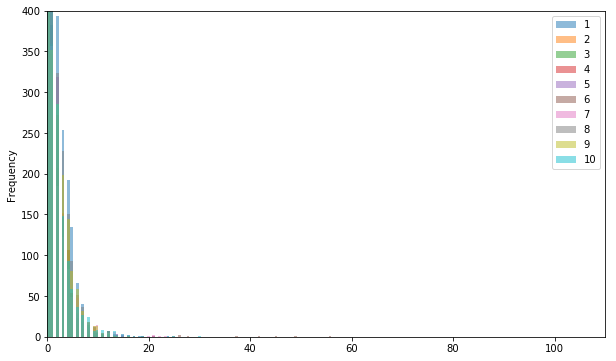

Finished tfidf comparison, took 25.500707864761353



BATTERYTECH

tfidf comparison

Sample file 1 is 40% similar to corpus test file 3519
Sample file 2 is 20% similar to corpus test file 3812
Sample file 3 is 20% similar to corpus test file 2505
Sample file 4 is 20% similar to corpus test file 2505
Sample file 5 is 39% similar to corpus test file 2037
Sample file 6 is 32% similar to corpus test file 1210
Sample file 7 is 22% similar to corpus test file 3939
Sample file 8 is 27% similar to corpus test file 315
Sample file 9 is 15% similar to corpus test file 904
Sample file 10 is 32% similar to corpus test file 3939




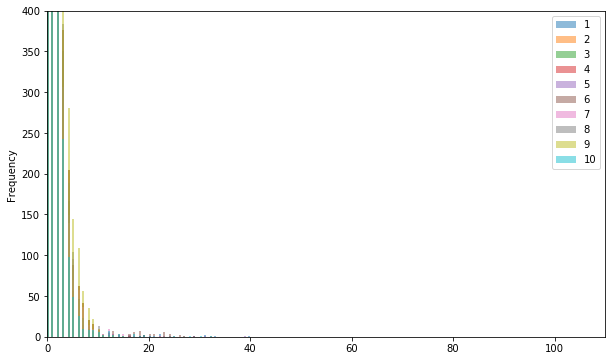

Finished tfidf comparison, took 42.4146990776062



BLACKSWANS

tfidf comparison

Sample file 1 is 44% similar to corpus test file 4474
Sample file 2 is 25% similar to corpus test file 3174
Sample file 3 is 26% similar to corpus test file 3473
Sample file 4 is 26% similar to corpus test file 3473
Sample file 5 is 26% similar to corpus test file 1390
Sample file 6 is 42% similar to corpus test file 1791
Sample file 7 is 17% similar to corpus test file 548
Sample file 8 is 15% similar to corpus test file 4379
Sample file 9 is 15% similar to corpus test file 842
Sample file 10 is 23% similar to corpus test file 3560




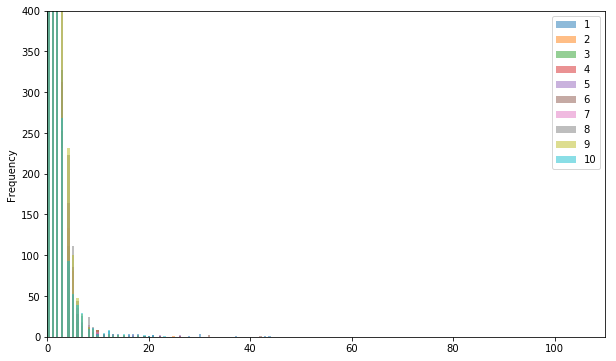

Finished tfidf comparison, took 53.303122997283936



BLOCKCHAIN

tfidf comparison

Sample file 1 is 39% similar to corpus test file 1598
Sample file 2 is 28% similar to corpus test file 1356
Sample file 3 is 24% similar to corpus test file 404
Sample file 4 is 24% similar to corpus test file 404
Sample file 5 is 15% similar to corpus test file 960
Sample file 6 is 27% similar to corpus test file 258
Sample file 7 is 21% similar to corpus test file 826
Sample file 8 is 16% similar to corpus test file 749
Sample file 9 is 19% similar to corpus test file 167
Sample file 10 is 33% similar to corpus test file 826




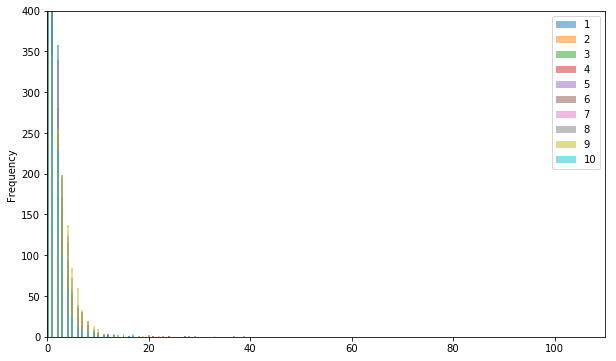

Finished tfidf comparison, took 18.02265214920044



CARBONERADICATION

tfidf comparison

Sample file 1 is 45% similar to corpus test file 83
Sample file 2 is 18% similar to corpus test file 462
Sample file 3 is 15% similar to corpus test file 389
Sample file 4 is 15% similar to corpus test file 389
Sample file 5 is 27% similar to corpus test file 1153
Sample file 6 is 55% similar to corpus test file 1117
Sample file 7 is 18% similar to corpus test file 3237
Sample file 8 is 20% similar to corpus test file 3144
Sample file 9 is 15% similar to corpus test file 2121
Sample file 10 is 29% similar to corpus test file 3237




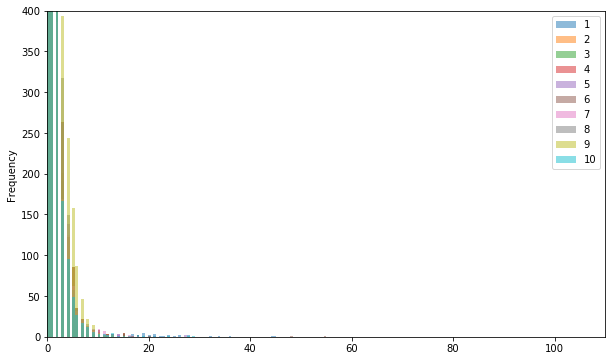

Finished tfidf comparison, took 35.99387502670288



COUNTERPARTYRISK

tfidf comparison

Sample file 1 is 27% similar to corpus test file 446
Sample file 2 is 12% similar to corpus test file 6677
Sample file 3 is 21% similar to corpus test file 2714
Sample file 4 is 21% similar to corpus test file 2714
Sample file 5 is 17% similar to corpus test file 4751
Sample file 6 is 21% similar to corpus test file 106
Sample file 7 is 15% similar to corpus test file 1147
Sample file 8 is 15% similar to corpus test file 4576
Sample file 9 is 17% similar to corpus test file 1092
Sample file 10 is 23% similar to corpus test file 4106




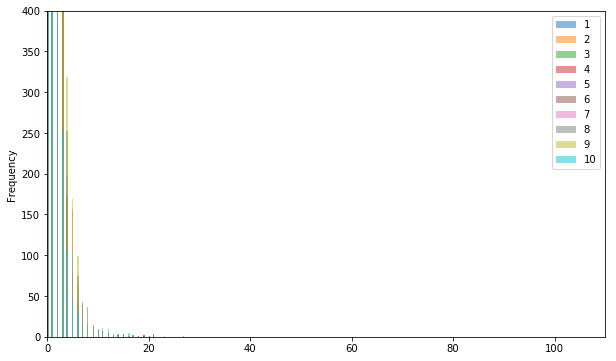

Finished tfidf comparison, took 56.19922995567322



DIGITALADS

tfidf comparison

Sample file 1 is 36% similar to corpus test file 2079
Sample file 2 is 21% similar to corpus test file 1111
Sample file 3 is 32% similar to corpus test file 1711
Sample file 4 is 32% similar to corpus test file 1711
Sample file 5 is 19% similar to corpus test file 2376
Sample file 6 is 28% similar to corpus test file 35
Sample file 7 is 16% similar to corpus test file 948
Sample file 8 is 14% similar to corpus test file 586
Sample file 9 is 20% similar to corpus test file 2839
Sample file 10 is 17% similar to corpus test file 2049




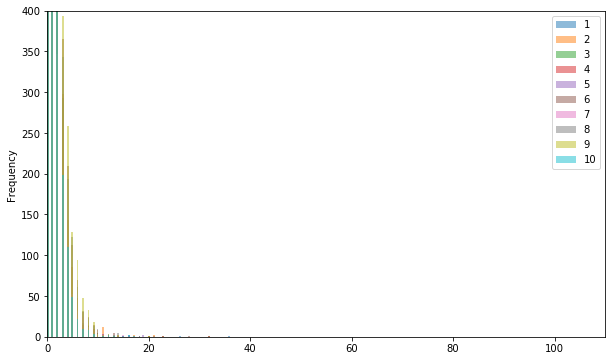

Finished tfidf comparison, took 28.813308238983154



DIGITALCURRENCY

tfidf comparison

Sample file 1 is 24% similar to corpus test file 304
Sample file 2 is 30% similar to corpus test file 882
Sample file 3 is 24% similar to corpus test file 186
Sample file 4 is 24% similar to corpus test file 186
Sample file 5 is 16% similar to corpus test file 560
Sample file 6 is 20% similar to corpus test file 339
Sample file 7 is 16% similar to corpus test file 620
Sample file 8 is 15% similar to corpus test file 304
Sample file 9 is 19% similar to corpus test file 1560
Sample file 10 is 33% similar to corpus test file 620




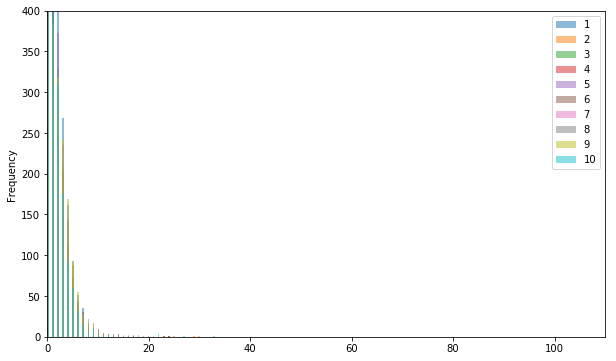

Finished tfidf comparison, took 24.116532802581787



DIGITALHEALTH

tfidf comparison

Sample file 1 is 20% similar to corpus test file 625
Sample file 2 is 23% similar to corpus test file 736
Sample file 3 is 22% similar to corpus test file 1409
Sample file 4 is 22% similar to corpus test file 1409
Sample file 5 is 20% similar to corpus test file 480
Sample file 6 is 18% similar to corpus test file 160
Sample file 7 is 17% similar to corpus test file 616
Sample file 8 is 19% similar to corpus test file 115
Sample file 9 is 16% similar to corpus test file 1767
Sample file 10 is 29% similar to corpus test file 1738




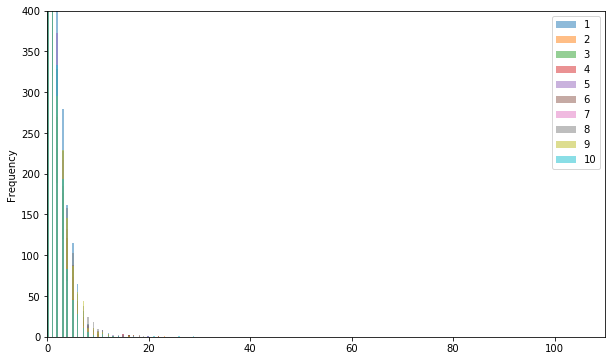

Finished tfidf comparison, took 20.19566011428833



EDUCATIONTECH

tfidf comparison

Sample file 1 is 16% similar to corpus test file 1000
Sample file 2 is 25% similar to corpus test file 669
Sample file 3 is 22% similar to corpus test file 980
Sample file 4 is 22% similar to corpus test file 980
Sample file 5 is 18% similar to corpus test file 1556
Sample file 6 is 16% similar to corpus test file 1435
Sample file 7 is 14% similar to corpus test file 82
Sample file 8 is 16% similar to corpus test file 443
Sample file 9 is 14% similar to corpus test file 348
Sample file 10 is 22% similar to corpus test file 82




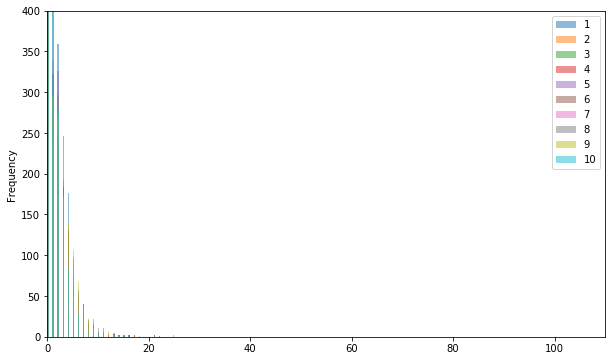

Finished tfidf comparison, took 17.763949871063232



FINANCIALSERVICES

tfidf comparison

Sample file 1 is 36% similar to corpus test file 3552
Sample file 2 is 17% similar to corpus test file 904
Sample file 3 is 31% similar to corpus test file 211
Sample file 4 is 31% similar to corpus test file 211
Sample file 5 is 23% similar to corpus test file 1001
Sample file 6 is 33% similar to corpus test file 2890
Sample file 7 is 13% similar to corpus test file 166
Sample file 8 is 13% similar to corpus test file 21
Sample file 9 is 15% similar to corpus test file 1096
Sample file 10 is 25% similar to corpus test file 3518




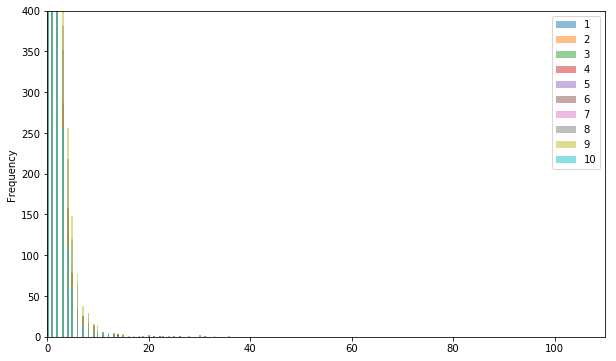

Finished tfidf comparison, took 36.5161030292511



INTERNETOFTHINGS

tfidf comparison

Sample file 1 is 14% similar to corpus test file 1585
Sample file 2 is 21% similar to corpus test file 488
Sample file 3 is 27% similar to corpus test file 413
Sample file 4 is 27% similar to corpus test file 413
Sample file 5 is 19% similar to corpus test file 170
Sample file 6 is 60% similar to corpus test file 1230
Sample file 7 is 29% similar to corpus test file 532
Sample file 8 is 16% similar to corpus test file 681
Sample file 9 is 13% similar to corpus test file 2489
Sample file 10 is 26% similar to corpus test file 428




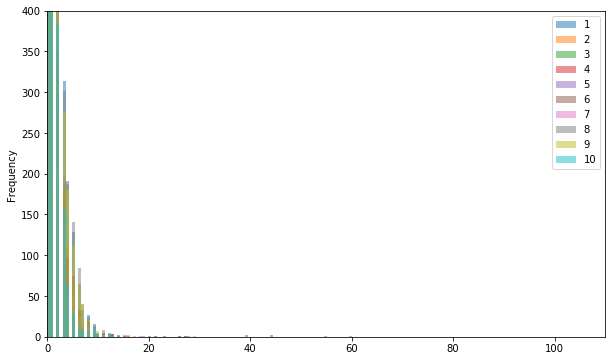

Finished tfidf comparison, took 24.623270988464355



PROPERTY

tfidf comparison

Sample file 1 is 50% similar to corpus test file 2109
Sample file 2 is 27% similar to corpus test file 2012
Sample file 3 is 18% similar to corpus test file 1011
Sample file 4 is 18% similar to corpus test file 1011
Sample file 5 is 29% similar to corpus test file 286
Sample file 6 is 22% similar to corpus test file 820
Sample file 7 is 25% similar to corpus test file 1727
Sample file 8 is 18% similar to corpus test file 2006
Sample file 9 is 16% similar to corpus test file 911
Sample file 10 is 36% similar to corpus test file 1727




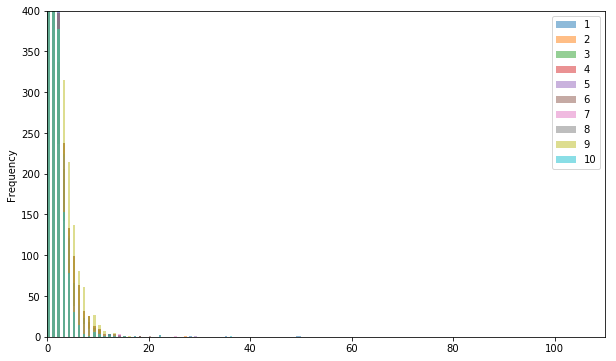

Finished tfidf comparison, took 23.043216228485107



SHARINGECONOMY

tfidf comparison

Sample file 1 is 37% similar to corpus test file 2870
Sample file 2 is 20% similar to corpus test file 3155
Sample file 3 is 18% similar to corpus test file 2182
Sample file 4 is 18% similar to corpus test file 2182
Sample file 5 is 13% similar to corpus test file 3275
Sample file 6 is 47% similar to corpus test file 2626
Sample file 7 is 18% similar to corpus test file 127
Sample file 8 is 13% similar to corpus test file 1374
Sample file 9 is 18% similar to corpus test file 2074
Sample file 10 is 26% similar to corpus test file 127




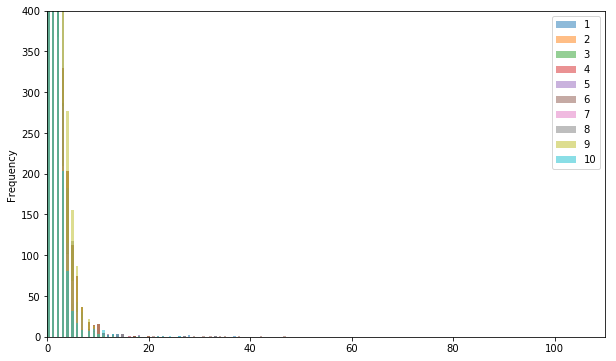

Finished tfidf comparison, took 46.488728046417236



    % sim    ai  % sim  batterytech  % sim  blackswans  % sim  blockchain  \
0      21   526     40         3519     44        4474     39        1598   
1      21  1031     20         3812     25        3174     28        1356   
2      16  1259     20         2505     26        3473     24         404   
3      16  1259     20         2505     26        3473     24         404   
4      24   327     39         2037     26        1390     15         960   
5      56    64     32         1210     42        1791     27         258   
6      23  1431     22         3939     17         548     21         826   
7      19   212     27          315     15        4379     16         749   
8      16  1585     15          904     15         842     19         167   
9      30    72     32         3939     23        3560     33         826   
10     56     0     40            0     44           0     39           0   

    % sim  carbonerad

In [1]:
# Comparing an unclassified sample across all the 
# different topics, using tdidf

import plot_comparison
final_scores = plot_comparison.compare_all_topics("unclassified", "tfidf")
print(final_scores)

In [2]:
# Row 10 shows the highest similarity score in each column, 
# allowing us to work out which is the likely best fit category
# for each of our unclassified articles. Remember to add one to the
# index number to cross ref with the article number

final_scores

,% sim,ai,% sim,batterytech,% sim,blackswans,% sim,blockchain,% sim,carboneradication,...,% sim,educationtech,% sim,financialservices,% sim,internetofthings,% sim,property,% sim,sharingeconomy
0,21,526,40,3519,44,4474,39,1598,45,83,...,16,1000,36,3552,14,1585,50,2109,37,2870
1,21,1031,20,3812,25,3174,28,1356,18,462,...,25,669,17,904,21,488,27,2012,20,3155
2,16,1259,20,2505,26,3473,24,404,15,389,...,22,980,31,211,27,413,18,1011,18,2182
3,16,1259,20,2505,26,3473,24,404,15,389,...,22,980,31,211,27,413,18,1011,18,2182
4,24,327,39,2037,26,1390,15,960,27,1153,...,18,1556,23,1001,19,170,29,286,13,3275
5,56,64,32,1210,42,1791,27,258,55,1117,...,16,1435,33,2890,60,1230,22,820,47,2626
6,23,1431,22,3939,17,548,21,826,18,3237,...,14,82,13,166,29,532,25,1727,18,127
7,19,212,27,315,15,4379,16,749,20,3144,...,16,443,13,21,16,681,18,2006,13,1374
8,16,1585,15,904,15,842,19,167,15,2121,...,14,348,15,1096,13,2489,16,911,18,2074
9,30,72,32,3939,23,3560,33,826,29,3237,...,22,82,25,3518,26,428,36,1727,26,127


In [3]:
final_scores.to_csv("final_scores.csv")

### Doc2Vec

In [13]:
import doc2vec_model

In [5]:
doc2vec_model.create_doc2vec_corpus("Topics/counterpartyrisk")

In [16]:
doc2vec_model.create_doc2vec_corpus("Topics sample/unclassified")

Created doc2vec corpus, took 0.4733870029449463




In [15]:
train_corpus = doc2vec_model.doc2vec_train_corpus("Topics/counterpartyrisk")
print(train_corpus)

Created training corpus, took 3.165053129196167


[TaggedDocument(words=['hsbc', 'appoints', 'new', 'chairman', 'hsbc', 'has', 'appointed', 'mark', 'tucker', 'as', 'new', 'group', 'chairman', 'he', 'will', 'take', 'over', 'the', 'role', 'on', 'october', 'st', 'mr', 'tucker', 'was', 'previously', 'chief', 'executive', 'of', 'asian', 'insurer', 'aia', 'position', 'he', 'held', 'for', 'years'], tags=[0]), TaggedDocument(words=['efg', 'hermes', 'makes', 'acquisition', 'efg', 'hermes', 'frontier', 'holding', 'which', 'is', 'wholly', 'owned', 'by', 'efg', 'hermes', 'has', 'acquired', 'of', 'invest', 'finance', 'securities', 'limited'], tags=[1]), TaggedDocument(words=['rbs', 'reports', 'ninth', 'straight', 'annual', 'loss', 'royal', 'bank', 'of', 'scotland', 'fy', 'profit', 'loss', 'of', 'bn', 'bn', 'against', 'bn', 'loss', 'yoy', 'due', 'to', 'higher', 'misconduct', 'charges', 'and', 'restructuring', 'costs'], tags=[2]), TaggedDocument(words=['cimb', 'has', 'shut', 'over', 'branches', 'over

In [22]:
test_corpus = doc2vec_model.doc2vec_test_corpus("Topics sample/unclassified")
print(test_corpus)

Created testing corpus, took 0.11698102951049805


[['iowa', 'state', 'fair', 'attractions', 'trump', 'clinton', 'sanders', 'and', 'helicopterthe', 'road', 'to', 'the', 'white', 'house', 'leads', 'from', 'the', 'life', 'size', 'cow', 'carved', 'from', 'pounds', 'of', 'butter', 'here', 'at', 'the', 'iowa', 'state', 'fair', 'to', 'the', 'stand', 'selling', 'grilled', 'pork', 'chops', 'on', 'stick', 'there', 'where', 'hillary', 'rodham', 'clinton', 'was', 'strolling', 'saturday', 'shaking', 'hands', 'and', 'posing', 'for', 'selfies', 'with', 'sweaty', 'supporters', 'under', 'an', 'unforgiving', 'sun', 'when', 'the', 'whirring', 'sound', 'of', 'helicopter', 'blades', 'approached', 'then', 'grew', 'louder', 'then', 'louder', 'still', 'look', 'up', 'in', 'the', 'sky', 'greta', 'tarbell', 'cried', 'out', 'there', 'trump', 'he', 'got', 'his', 'own', 'helicopter', 'have', 'at', 'it', 'baby', 'the', 'black', 'chopper', 'with', 'bold', 'white', 'letters', 'spelling', 'circled', 'the', 'fairground

In [16]:
model = doc2vec_model.train_doc2vec_model(train_corpus)

Created vocabulary, took 3.9685521125793457


Trained model, took 17.33946204185486




In [7]:
wordlist = ['barclays', 
            'is', 'a', 
            'useless', 
            'bunch', 
            'of', 
            'bankers']
inferred_vector = doc2vec_model.infer_vector(model, wordlist)
print(inferred_vector)

[-0.02667375 -0.03177507  0.00468334  0.01358099  0.02187881 -0.09362444
 -0.06342471 -0.06769514  0.02667286  0.0071733   0.05977457  0.01029353
  0.01869676  0.03721515  0.03349767  0.0689993  -0.02073302  0.038158
 -0.00061468 -0.01681628 -0.02498201 -0.01875693 -0.03295427  0.00542527
 -0.01801467  0.03735184 -0.0809576   0.03768997  0.03065927  0.01385332
  0.03243276  0.00913983 -0.00449988 -0.0255633   0.04478567 -0.06733698
 -0.03119081 -0.03923262  0.07143667 -0.00937288  0.02521965 -0.01145452
  0.02347648  0.01910924  0.0007542   0.0013876  -0.01689804 -0.01834121
 -0.01069793  0.00686363]


In [17]:
ranks, second_ranks = doc2vec_model.assess_model(model, train_corpus)

In [18]:
ranks

[0,
 1641,
 0,
 0,
 4,
 10,
 0,
 0,
 24,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 21,
 0,
 0,
 0,
 2,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 653,
 0,
 63,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 5,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 23,
 0,
 0,
 4,
 0,
 1,
 86,
 0,
 0,
 0,
 0,
 190,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 242,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 2830,
 7,
 860,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 3,
 0,
 0,
 0,
 63,
 40,
 0,
 2,
 0,
 0,
 0,
 0,
 0,
 0,
 3,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 872,
 0,
 729,
 0,
 0,
 824,
 1,
 0,
 0,
 0,
 124,
 1475,
 851,
 0,
 4,
 27,
 18,
 148,
 7,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 11,
 147,
 0,
 0,
 2,
 15,
 2689,
 17,
 5,
 0,
 4,
 13,
 235,
 43,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 41,
 0,
 0,
 41,
 7,
 0,
 13,
 0,
 65,
 1007,
 0,
 423,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 5,
 77,
 1,
 82,
 0,
 0,
 0,
 0,
 0

In [19]:
second_ranks

[(5249, 0.7125357389450073),
 (6364, 0.8025108575820923),
 (945, 0.6962485313415527),
 (3563, 0.6209887266159058),
 (3769, 0.6662425994873047),
 (268, 0.7186643481254578),
 (2789, 0.6006482243537903),
 (1397, 0.6713703274726868),
 (5521, 0.8064864873886108),
 (9, 0.6993356943130493),
 (2356, 0.7210569381713867),
 (11, 0.726747989654541),
 (2590, 0.7717734575271606),
 (2996, 0.7960328459739685),
 (4991, 0.7903925180435181),
 (4791, 0.8414880037307739),
 (5370, 0.6045301556587219),
 (1624, 0.8046029806137085),
 (3996, 0.8253905177116394),
 (1239, 0.6664914488792419),
 (2356, 0.7534229159355164),
 (2610, 0.5584250688552856),
 (3218, 0.8065124750137329),
 (4338, 0.746479332447052),
 (2525, 0.8303192853927612),
 (3542, 0.818592369556427),
 (601, 0.8455770015716553),
 (3344, 0.6443353891372681),
 (6584, 0.8025064468383789),
 (498, 0.7954126596450806),
 (6678, 0.7724785208702087),
 (2359, 0.8087402582168579),
 (509, 0.7475941777229309),
 (584, 0.6368597745895386),
 (2154, 0.6304361820220947),

In [20]:
import collections
collections.Counter(ranks) 

Counter({0: 5533,
         1: 397,
         2: 128,
         3: 82,
         4: 71,
         5: 37,
         6: 23,
         7: 36,
         8: 24,
         9: 19,
         10: 19,
         11: 14,
         12: 11,
         13: 12,
         14: 13,
         15: 8,
         16: 13,
         17: 9,
         18: 8,
         19: 10,
         20: 5,
         21: 10,
         22: 5,
         23: 8,
         24: 4,
         25: 5,
         26: 6,
         27: 2,
         28: 6,
         29: 2,
         30: 3,
         31: 7,
         32: 2,
         33: 1,
         34: 4,
         35: 6,
         36: 2,
         37: 8,
         38: 2,
         39: 5,
         40: 2,
         41: 4,
         42: 2,
         43: 3,
         44: 1,
         45: 5,
         46: 3,
         47: 1,
         48: 3,
         49: 2,
         50: 7,
         51: 1,
         52: 2,
         54: 3,
         55: 3,
         56: 2,
         57: 1,
         59: 1,
         60: 3,
         61: 4,
         62: 4,
         63:

In [29]:
# Single unclassified document comparison with Counterparty Risk corpus 

doc2vec_model.compare_document(model, 6, test_corpus, train_corpus)

Test Document (6): «faa site shows flight delays of minutes or lessthis image made from the website flightradar com shows air traffic over the eastern half of the united states on saturday aug at edt flights bound for the washington area and some flights from airports in the new york city area that must fly over the washington region were being delayed or grounded saturday due to technical issues at an air traffic control center in virginia the federal aviation administration said flightradar com via ap mandatory credit flightradar com»

SIMILAR/DISSIMILAR DOCS PER MODEL Doc2Vec(dm/m,d50,n5,w5,mc2,s0.001,t3):

MOST (6611, 0.6069551110267639): «cbi calls for name blind recruitment potential employers should use name blind applications in which candidates are anonymous in order to increase diversity and productivity according to report from uk employers group the confederation of british industry the report which is published on monday states that brexit has highlighted the challenges fa

In [30]:
train_corpus = doc2vec_model.doc2vec_train_corpus("Topics/internetofthings")
print(train_corpus)

Created training corpus, took 1.4095542430877686


[TaggedDocument(words=['test', 'integrated', 'build', 'ignorable', 'test', 'data'], tags=[0]), TaggedDocument(words=['cisco', 'and', 'sas', 'institute', 'develop', 'iot', 'on', 'the', 'edge', 'platform', 'cisco', 'and', 'the', 'sas', 'institute', 'are', 'integrating', 'the', 'former', 'unified', 'computing', 'system', 'with', 'the', 'latter', 'analytics', 'to', 'create', 'an', 'edge', 'to', 'enterprise', 'internet', 'of', 'things', 'analytics', 'platform', 'the', 'new', 'software', 'will', 'offer', 'analytics', 'for', 'networks', 'based', 'on', 'volume', 'latency', 'and', 'velocity', 'requirements', 'the', 'platform', 'will', 'offer', 'data', 'processing', 'remotely', 'from', 'data', 'centres', 'to', 'enable', 'analytics', 'can', 'be', 'carried', 'out', 'using', 'systems', 'on', 'the', 'edge', 'sas', 'cto', 'oliver', 'schabenberger', 'said', 'we', 'cannot', 'afford', 'to', 'wait', 'and', 'activate', 'data', 'in', 'iot', 'in', 'the', 'd

In [32]:
model = doc2vec_model.train_doc2vec_model(train_corpus)

Created vocabulary, took 0.965008020401001


Trained model, took 6.592658758163452




In [40]:
# Single unclassified document comparison with Internet of Things corpus 

doc2vec_model.compare_document(model, 8, test_corpus, train_corpus)

Test Document (8): «delta wings it to number onebrendon thorne delta goodrem poses during the voice in sydney australia delta goodrem is ecstatic after scoring her first number one hit in eight years with wings thank you yes the others these past years all stayed at and and it nice to see this one at xx she tweeted on sunday morning the singer best known of late for her onscreen disagreements with fellow coach jessie on reality show the voice has not scored number one hit on the aria chart since in this life in wings which she co wrote with songwriting and production company dna represents where she is now because it is about letting go and looking for new horizons goodrem said in july wings just feels fresh the meaning of the song is about looking for new horizons everybody is looking for second chance she said wanted wings to convey that liberated feeling with bit of wildness meets bit of letting go that been big theme where ve kind of let lot go these wings are made to fly she said 

In [19]:
# Single unclassified document comparison with Artificial Intelligence corpus 

doc2vec_model.compare_document(model, 1, test_corpus, train_corpus)

Test Document (1): «more than music featured at maha music festivalwith several nonprofit organizations holding activities on site the maha music festival offered more than just music this year maha itself is nonprofit organization and we have other nonprofits on site today doing activities that further their mission julie dewitt said laura doherty spent saturday volunteering for st pius st leo school asking some festivalgoers to be part of banner the school with display on its campus maha is filled with diverse community and we re trying to bring all of that in to our banner because that what our school is all about doherty said each person art is just one piece of something much larger it very special it very touching doherty said so it good thing we love it one group took part in game of foosball with human players part of the stipulation of being involved in the community village is try to be interactive with the people that come and watch the music just to kind of keep them entert

In [5]:
# Create doc2vec corpuses in all the topic categories

import os
import doc2vec_model

directory = os.fsencode("./data/Topics/")

for subdirectory in os.listdir(directory):
    subdirectoryname = os.fsdecode(subdirectory)
    if not subdirectoryname == ".DS_Store":
        print(subdirectoryname)
        sourcedir = ("Topics/" + subdirectoryname)
        doc2vec_model.create_doc2vec_corpus(sourcedir)

ai
Created doc2vec corpus, took 17.53955316543579


batterytech
Created doc2vec corpus, took 41.28711700439453


blackswans
Created doc2vec corpus, took 49.19256591796875


blockchain
Created doc2vec corpus, took 14.263342142105103


carboneradication
Created doc2vec corpus, took 30.72170114517212


counterpartyrisk
Created doc2vec corpus, took 51.953113079071045


digitalads
Created doc2vec corpus, took 27.396789073944092


digitalcurrency
Created doc2vec corpus, took 19.531430959701538


digitalhealth
Created doc2vec corpus, took 19.34597086906433


educationtech
Created doc2vec corpus, took 14.621313095092773


financialservices
Created doc2vec corpus, took 32.91630721092224


internetofthings
Created doc2vec corpus, took 20.354730129241943


property
Created doc2vec corpus, took 17.993510961532593


sharingeconomy
Created doc2vec corpus, took 28.06730604171753




In [1]:
import plot_comparison
comparison_df =  plot_comparison.plot_comparison("ai","unclassified", "doc2vec")

Created training corpus, took 1.555649995803833


Created vocabulary, took 0.9048731327056885


Trained model, took 6.3489580154418945




In [2]:
print(comparison_df)

                            1                          2  \
0  (1481, 0.8112854957580566)  (197, 0.8674558401107788)   

                           3                          4  \
0  (142, 0.7563773393630981)  (287, 0.7217772603034973)   

                          5                         6  \
0  (309, 0.937584400177002)  (56, 0.8715112805366516)   

                           7                          8  \
0  (105, 0.8076413869857788)  (1048, 0.786821186542511)   

                            9                          10  
0  (1648, 0.8621785640716553)  (1597, 0.7691416144371033)  


In [17]:
import pandas as pd
#s = comparison_df[0].apply(lambda x: x.split())
#comparison_df['best fit'] = s.apply(lambda x: x[0])
#comparison_df['%sim'] = s.apply(lambda x: x[1])

comparison_df.to_csv("doc2vectest.csv")

## 4. Topic Modelling

In [1]:
# Extract and normalise the raw Curation editorial jsons
# without subdividing into editorial categories

%run json_converter "all_topics.json" "All topics"

Source file = all_topics.json
Target directory = All topics
Finished converting, took 159.4594008922577


In [2]:
# Create the corpus

%run create_bow_corpus "All topics"

Source directory = All topics
Corpus is stored in All topics
Dictionary: Dictionary(22606 unique tokens: ['Data', 'show', 'US', 'manufacture', 'robot']...) 

Finished bag-of-words corpus and dictionary creation, took 1067.7560498714447


In [23]:
# Define the dictionary variable with the dictionary we've just created
# NB We have moved the "All topics" folder up a level before this step,
# so it does not interfere with attempts to rerun earlier sections of 
# this workbook


dictionary = corpora.Dictionary.load('./data/All topics/_bow_corpus.dict')

In [30]:
# Define the dictionary and corpus variables with the dictionary 
# and corpus we've just created, and create a model with 14 topics
# NB We have moved the "All topics" folder up a level before this step,
# so it does not interfere with attempts to rerun earlier sections of 
# this workbook 

import gensim
from gensim import corpora
from gensim.models import LdaMulticore 

dictionary = corpora.Dictionary.load('./data/All topics/_bow_corpus.dict')
corpus = corpora.MmCorpus('./data/All topics/_bow_corpus.mm')

model = LdaMulticore(corpus, id2word=dictionary, num_topics=14)
model.save('./data/lda/all_topics.lda')
model.print_topics(-1) 

[(0,
  '0.015*"Airbnb" + 0.009*"say" + 0.008*"attack" + 0.007*"business" + 0.006*"WeWork" + 0.006*"space" + 0.006*"Ola" + 0.006*"would" + 0.006*"``" + 0.005*"co-working"'),
 (1,
  '0.011*"use" + 0.006*"new" + 0.005*"study" + 0.005*"``" + 0.004*"disease" + 0.004*"find" + 0.004*"company" + 0.004*"system" + 0.004*"device" + 0.004*"also"'),
 (2,
  '0.082*"\'\'" + 0.033*"/a" + 0.033*"href=" + 0.030*"http" + 0.015*"attack" + 0.009*"ISIS" + 0.007*"report" + 0.007*"Russia" + 0.006*"security" + 0.006*"US"'),
 (3,
  '0.022*"span" + 0.022*"/span" + 0.014*"ad" + 0.013*"nbsp" + 0.009*"rsquo" + 0.007*"Kong" + 0.007*"Hong" + 0.006*"million" + 0.006*"VR" + 0.006*"year"'),
 (4,
  '0.019*"US" + 0.014*"tax" + 0.008*"say" + 0.008*"bank" + 0.006*"company" + 0.006*"pay" + 0.006*"state" + 0.006*"government" + 0.006*"risk" + 0.004*"``"'),
 (5,
  '0.017*"vehicle" + 0.014*"car" + 0.012*"electric" + 0.011*"Tesla" + 0.010*"battery" + 0.009*"fuel" + 0.009*"new" + 0.008*"could" + 0.007*"technology" + 0.007*"energy"

In [36]:
# Define a function to handle a query procedure
# matching a given text to the LDA topics
def comparison(query):
    query = query.split()
    query = dictionary.doc2bow(query)
    return query

# Run a query 
query = 'Despite the notion that the 2.3 million adults living with their parents are saving money for a property, a new survey shows that 50% of millennials have less than $1,000 of savings, in addition to being burdened with student debt. Foreign money, investor dominance and high prices for properties in desirable areas are contributing to what this commentator calls "rental Armageddon," concluding that millennials are in no position to save the housing market.'
vector = comparison(query)
model[vector]
a = list(sorted(model[vector], key=lambda x: x[1]))
print(a[0])
print(model.print_topic(a[0][0])) #least related
print(a[-1])
print(model.print_topic(a[-1][0])) #most related

(13, 0.13216482917639819)
0.026*"Airbnb" + 0.017*"ISIS" + 0.014*"attack" + 0.010*"group" + 0.010*"student" + 0.009*"people" + 0.008*"kill" + 0.007*"hotel" + 0.006*"bomb" + 0.006*"online"
(4, 0.28871904627657763)
0.024*"year" + 0.020*"market" + 0.017*"price" + 0.015*"increase" + 0.014*"report" + 0.013*"rise" + 0.010*"property" + 0.009*"growth" + 0.009*"2015" + 0.008*"US"


In [34]:
# Extract 14 LDA topics using 20 full passes

model = LdaMulticore(corpus, id2word=dictionary, num_topics=14, passes=20)
model.save('./data/lda/all_topicsx20.lda')
model.print_topics(-1)


[(0,
  '0.025*"energy" + 0.022*"fuel" + 0.021*"power" + 0.016*"battery" + 0.013*"oil" + 0.013*"cell" + 0.013*"hydrogen" + 0.009*"water" + 0.009*"project" + 0.009*"Energy"'),
 (1,
  '0.171*"\'\'" + 0.073*"``" + 0.043*"/a" + 0.043*"href=" + 0.039*"http" + 0.018*"say" + 0.010*"report" + 0.007*"span" + 0.007*"/span" + 0.005*"note"'),
 (2,
  '0.029*"car" + 0.027*"Uber" + 0.024*"vehicle" + 0.014*"driver" + 0.013*"electric" + 0.011*"Tesla" + 0.010*"new" + 0.009*"company" + 0.009*"city" + 0.007*"service"'),
 (3,
  '0.030*"attack" + 0.021*"security" + 0.020*"data" + 0.013*"cyber" + 0.011*"health" + 0.009*"use" + 0.009*"patient" + 0.008*"information" + 0.007*"US" + 0.007*"company"'),
 (4,
  '0.024*"year" + 0.020*"market" + 0.017*"price" + 0.015*"increase" + 0.014*"report" + 0.013*"rise" + 0.010*"property" + 0.009*"growth" + 0.009*"2015" + 0.008*"US"'),
 (5,
  '0.021*"use" + 0.016*"drone" + 0.014*"technology" + 0.011*"IoT" + 0.010*"develop" + 0.010*"device" + 0.009*"system" + 0.008*"robot" + 0.00

In [35]:
query = 'Despite the notion that the 2.3 million adults living with their parents are saving money for a property, a new survey shows that 50% of millennials have less than $1,000 of savings, in addition to being burdened with student debt. Foreign money, investor dominance and high prices for properties in desirable areas are contributing to what this commentator calls ‘rental Armageddon,’ concluding that millennials are in no position to save the housing market.'
vector = comparison(query)
model[vector]
a = list(sorted(model[vector], key=lambda x: x[1]))
print(a[0])
print(model.print_topic(a[0][0])) #least related
print(a[-1])
print(model.print_topic(a[-1][0])) #most related

(13, 0.13216640717063935)
0.026*"Airbnb" + 0.017*"ISIS" + 0.014*"attack" + 0.010*"group" + 0.010*"student" + 0.009*"people" + 0.008*"kill" + 0.007*"hotel" + 0.006*"bomb" + 0.006*"online"
(4, 0.28871330951632795)
0.024*"year" + 0.020*"market" + 0.017*"price" + 0.015*"increase" + 0.014*"report" + 0.013*"rise" + 0.010*"property" + 0.009*"growth" + 0.009*"2015" + 0.008*"US"


## 5. Support Vector Machines & Naive Bayes

In [60]:
# Call a fresh version of our json_converter script, with a different target directory
# for the purposes of isolating the data for SVM, as the previous dataset is complicated
# by corpus and dictionary files which upset the SVM data import function.

import os
import json_converter_svm

directory = os.fsencode("./data/")

for file in os.listdir(directory):
    filename = os.fsdecode(file)
    if filename.endswith(".json"): 
        sourcefile = filename
        base = os.path.basename("./data/" + filename)
        targetdir = str(os.path.splitext(base)[0])
        print(sourcefile, targetdir)
        if not os.path.exists("./data/SVM topics/" + targetdir):
            os.makedirs("./data/SVM topics/" + targetdir)
        json_converter_svm.json_converter_svm(sourcefile, targetdir)
        continue
    else:
        continue


ai.json ai
Finished converting, took 2.003293991088867
batterytech.json batterytech
Finished converting, took 6.424905061721802
blackswans.json blackswans
Finished converting, took 11.348745107650757
blockchain.json blockchain
Finished converting, took 2.909464120864868
carboneradication.json carboneradication
Finished converting, took 4.832520961761475
counterpartyrisk.json counterpartyrisk
Finished converting, took 9.278902053833008
digitalads.json digitalads
Finished converting, took 3.5722439289093018
digitalcurrency.json digitalcurrency
Finished converting, took 2.8740627765655518
digitalhealth.json digitalhealth
Finished converting, took 2.4992969036102295
educationtech.json educationtech
Finished converting, took 2.0708532333374023
financialservices.json financialservices
Finished converting, took 5.424714088439941
internetofthings.json internetofthings
Finished converting, took 5.9693381786346436
property.json property
Finished converting, took 3.9865002632141113
sharingeconomy

In [106]:
# Import the content data and define as a scikit learn dataset

import numpy as np
import time
import sklearn.datasets

from sklearn.cross_validation import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import svm, grid_search
from sklearn.pipeline import Pipeline
from sklearn.linear_model import SGDClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
from sklearn import metrics

databunch = sklearn.datasets.load_files("./data/SVM topics/", description=None, categories=None, load_content=True, shuffle=True, encoding=None, decode_error='strict', random_state=0)

In [72]:
databunch

{'DESCR': None,
 'data': [b'{\n    "content": "Angola\'s public spending cuts ignite Yellow Fever outbreak\\n<p>As a result of plunging oil prices, Angola\'s Government slashed public spending last year; and the budget of Africa\'s second largest oil exporter has just been cut again this year, leaving it 40% lower than two years ago. A knock-on effect of this is that public services, such as rubbish collection and water sanitation, have stalled, resulting in a surge in deadly diseases. In just two months, 37 people have died from a Yellow Fever outbreak; eight cases have been reported in the last 24 hours. There has also been an increase in cases of malaria and cholera. As we have previously noted, Angola is already suffering from high unemployment, a fragile banking sector and political issues in a <a href=\\"http://www.coface.com/Economic-Studies-and-Country-Risks/Angola\\">country that has</a> significant economic potential with resources including diamonds, copper, iron, gold and h

In [107]:
# Split the data for cross-validation purposes

from sklearn.cross_validation import train_test_split

X_train, X_test, y_train, y_test = train_test_split(databunch.data, databunch.target, test_size=.4)

In [73]:
X_train[:2]

[b'{\n    "content": "SEB reports profits down for Q4 2016<p>Skandinaviska Enskilda Banken - Q4 2016 net profit of SEK 4.24bn ($485m), down 8% YoY.</p>\\n",\n    "date": "2017-02-01T08:20:19.52+00:00"\n}',
 b'{\n    "content": "Carbon carousel charges against ex-Deutsche Bank execs \'to be dismissed\'\\n<p>Juergen Fitschen, Deutsche Bank\'s former co-chief executive and former CFO, has been cleared of conspiring to evade taxes in the trading of carbon emissions certificates, according to a person familiar with the matter. The case relates to \\"carousel trades\\" in the EU carbon\xc2\xa0market during 2009 and 2010, where buyers sold on imported emissions permits and added VAT to the price, producing tax refunds when no tax had been paid. Investigations were also halted against Stefan Krause of Warburg Pincus. While handing down suspended sentences to five other former Deutsche employees, Judge Martin Bach was critical of the bank, saying the \\"failure of all security mechanisms\\" had

In [74]:
X_test[:2]

[b'{\n    "content": "Leaked: imagines of Audi\'s electric Tesla-rivalImages of Audi\xe2\x80\x99s all-new Q6 have been leaked online months before its reveal at this September\xe2\x80\x99s Frankfurt motor show. The renderings, thought to be official, first appeared late yesterday on German website Auto Motor und Sport and are thought to be final drawings of the concept, codenamed C-BEV, that will preview the zero-emission Q6 e-tron. The images can be seen <a href=\\"http://www.auto-motor-und-sport.de/news/audi-q6-auf-der-iaa-erste-bilder-vom-tesla-fighter-3970725.html\\">here</a>.",\n    "date": "2015-07-30T04:13:49.897+00:00"\n}',
 b'{\n    "content": "Accenture: Today\'s Internet Of Things Is Not SustainableThe current focus of IoT is misplaced on technology and gadget, and not where it should be - creating a better experience for consumers, according to the Chief Technology Officer of Accenture, Paul Daugherty. Speaking at MIT, he added that the reason for the high abandonment rate 

In [75]:
y_train[:4]

array([5, 4, 1, 5])

In [76]:
y_test[:4]

array([ 1, 11, 10, 13])

In [77]:
[databunch.target_names[idx] for idx in y_test[:10]]

['batterytech',
 'internetofthings',
 'financialservices',
 'sharingeconomy',
 'batterytech',
 'digitalcurrency',
 'sharingeconomy',
 'financialservices',
 'educationtech',
 'financialservices']

In [65]:
databunch.target_names

['ai',
 'batterytech',
 'blackswans',
 'blockchain',
 'carboneradication',
 'counterpartyrisk',
 'digitalads',
 'digitalcurrency',
 'digitalhealth',
 'educationtech',
 'financialservices',
 'internetofthings',
 'property',
 'sharingeconomy']

In [108]:
# Extract features from the dataset using tf-idf sparse vectorizer

print("Extracting features from the training data using a sparse vectorizer")
start_time = time.time()
vectorizer = TfidfVectorizer(sublinear_tf=True, max_df=0.5, stop_words='english')
X_train_Tfidf = vectorizer.fit_transform(X_train)
print("Done in {}".format(time.time() - start_time))

print("Extracting features from the test data using the same vectorizer")
start_time = time.time()
X_test_Tfidf = vectorizer.transform(X_test)
print("Done in {}".format(time.time() - start_time))


Extracting features from the training data using a sparse vectorizer
Done in 7.381348133087158
Extracting features from the test data using the same vectorizer
Done in 4.123111963272095


In [71]:
X_train_Tfidf.shape

(26101, 56450)

In [78]:
y_train

array([ 5,  4,  1, ...,  8, 12, 13])

First we will use our data to predict using Naive Bayes

In [109]:
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(X_train_Tfidf, y_train)

In [110]:
# To try to predict the outcome on a new document we need 
# to extract the features using almost the same feature 
# extracting chain as before. The difference is that we 
# call transform instead of fit_transform on the transformers, 
# since they have already been fit to the training set:

docs_new = ["UK government may be planning diesel-scrappage scheme<p>The UK's Department for Transport and the Department for Environment, Food and Rural Affairs is in talks to introduce a diesel vehicle scrappage scheme as the country searches for ways to cut carbon emissions and pollution, according to unnamed sources. The strategy would offer a discount on low-emissions cars or cash back to drivers who choose to trade in their old diesel vehicles. A Department for Transport spokesperson said there are presently no plans to introduce a scrappage scheme. However, Transport Secretary Chris Grayling has shown support for the measures in industry meetings, according to the Telegraph.</p>"
, "UK-led consortium looks to robots to monitor windfarms and cables<p>A UK-led consortium is launching a $5m project to use robots for monitoring offshore wind farms and undersea cabling. The Engineering and Physical Sciences Research Council (EPSRC)-backed scheme hopes to improve how wind farms are maintained and managed. The project is developing \"novel sensing techniques\" to inspect systems in the field, said Dr David Flynn, director of Smart Systems Group at Heriot-Watt University, a member of the consortium. These include a dolphin-inspired local frequency sonar attached to an autonomous vehicle that can be used to inspect undersea cables, and drones to inspect offshore substations.</p>\n", 
            "Ubtech partners with Amazon's Alexa in new robot<p>Ubtech Robotics has partnered with Amazon to bring Alexa, Amazon’s virtual assistant, to its latest robot, Lynx. Owners of Lynx will be able to interact with it as though it were a personal assistant. Since its launch, Amazon has sold millions of Echo devices, but lately they have begun to free Alexa from her Echo chamber, installing the natural language-processing assistant in home devices, wearable technology, cars and even robots. Amazon seems to be using partners such as Ubtech to redefine the physical form of its cloud-based technology.</p>\n"]

X_new_tfidf = vectorizer.transform(docs_new)

predicted = clf.predict(X_new_tfidf)

for doc, category in zip(docs_new, predicted):
    print('%r => %s \n' % (doc, databunch.target_names[category]))

"UK government may be planning diesel-scrappage scheme<p>The UK's Department for Transport and the Department for Environment, Food and Rural Affairs is in talks to introduce a diesel vehicle scrappage scheme as the country searches for ways to cut carbon emissions and pollution, according to unnamed sources. The strategy would offer a discount on low-emissions cars or cash back to drivers who choose to trade in their old diesel vehicles. A Department for Transport spokesperson said there are presently no plans to introduce a scrappage scheme. However, Transport Secretary Chris Grayling has shown support for the measures in industry meetings, according to the Telegraph.</p>" => carboneradication 

'UK-led consortium looks to robots to monitor windfarms and cables<p>A UK-led consortium is launching a $5m project to use robots for monitoring offshore wind farms and undersea cabling. The Engineering and Physical Sciences Research Council (EPSRC)-backed scheme hopes to improve how wind far

In [111]:
predicted = clf.predict(X_test_Tfidf)

print("\nMean prediction accuracy is: ", np.mean(predicted == y_test))
print("\n\nClassification report:\n", metrics.classification_report(y_test, 
                                                                    predicted, 
                                                                    target_names = databunch.target_names))
print("\n\nConfusion matrix:\n", metrics.confusion_matrix(y_test, predicted))



Mean prediction accuracy is:  0.613700362048


Classification report:
                    precision    recall  f1-score   support

               ai       0.80      0.13      0.23       714
      batterytech       0.63      0.86      0.73      1601
       blackswans       0.66      0.72      0.69      1972
       blockchain       0.35      0.01      0.02       631
carboneradication       0.81      0.70      0.75      1483
 counterpartyrisk       0.46      0.94      0.62      2744
       digitalads       0.88      0.90      0.89      1147
  digitalcurrency       0.41      0.03      0.06       784
    digitalhealth       0.81      0.43      0.57       759
    educationtech       0.90      0.42      0.57       621
financialservices       0.52      0.53      0.53      1605
 internetofthings       0.75      0.58      0.65      1038
         property       0.92      0.09      0.16       881
   sharingeconomy       0.62      0.69      0.65      1421

      avg / total       0.65      0.61   

Let's try this with SVM (linear kernel/polynomial kernel/rbf kernel).

In [82]:
# Using a linear model

from sklearn.svm import SVC
clf = SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape=None, degree=3, gamma='auto', kernel='linear',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False).fit(X_train_Tfidf, y_train)

predicted = clf.predict(X_new_tfidf)

for doc, category in zip(docs_new, predicted):
    print('%r => %s \n' % (doc, databunch.target_names[category]))

"UK government may be planning diesel-scrappage scheme<p>The UK's Department for Transport and the Department for Environment, Food and Rural Affairs is in talks to introduce a diesel vehicle scrappage scheme as the country searches for ways to cut carbon emissions and pollution, according to unnamed sources. The strategy would offer a discount on low-emissions cars or cash back to drivers who choose to trade in their old diesel vehicles. A Department for Transport spokesperson said there are presently no plans to introduce a scrappage scheme. However, Transport Secretary Chris Grayling has shown support for the measures in industry meetings, according to the Telegraph.</p>" => carboneradication 

'UK-led consortium looks to robots to monitor windfarms and cables<p>A UK-led consortium is launching a $5m project to use robots for monitoring offshore wind farms and undersea cabling. The Engineering and Physical Sciences Research Council (EPSRC)-backed scheme hopes to improve how wind far

In [85]:
# Using a polynomial model

from sklearn.svm import SVC
clf = SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape=None, degree=3, gamma='auto', kernel='poly',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False).fit(X_train_Tfidf, y_train)

predicted = clf.predict(X_new_tfidf)

for doc, category in zip(docs_new, predicted):
    print('%r => %s \n' % (doc, databunch.target_names[category]))

"UK government may be planning diesel-scrappage scheme<p>The UK's Department for Transport and the Department for Environment, Food and Rural Affairs is in talks to introduce a diesel vehicle scrappage scheme as the country searches for ways to cut carbon emissions and pollution, according to unnamed sources. The strategy would offer a discount on low-emissions cars or cash back to drivers who choose to trade in their old diesel vehicles. A Department for Transport spokesperson said there are presently no plans to introduce a scrappage scheme. However, Transport Secretary Chris Grayling has shown support for the measures in industry meetings, according to the Telegraph.</p>" => counterpartyrisk 

'UK-led consortium looks to robots to monitor windfarms and cables<p>A UK-led consortium is launching a $5m project to use robots for monitoring offshore wind farms and undersea cabling. The Engineering and Physical Sciences Research Council (EPSRC)-backed scheme hopes to improve how wind farm

In [86]:
# Using a radial basis function model

from sklearn.svm import SVC
clf = SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape=None, degree=3, gamma='auto', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False).fit(X_train_Tfidf, y_train)

predicted = clf.predict(X_new_tfidf)

for doc, category in zip(docs_new, predicted):
    print('%r => %s \n' % (doc, databunch.target_names[category]))

"UK government may be planning diesel-scrappage scheme<p>The UK's Department for Transport and the Department for Environment, Food and Rural Affairs is in talks to introduce a diesel vehicle scrappage scheme as the country searches for ways to cut carbon emissions and pollution, according to unnamed sources. The strategy would offer a discount on low-emissions cars or cash back to drivers who choose to trade in their old diesel vehicles. A Department for Transport spokesperson said there are presently no plans to introduce a scrappage scheme. However, Transport Secretary Chris Grayling has shown support for the measures in industry meetings, according to the Telegraph.</p>" => counterpartyrisk 

'UK-led consortium looks to robots to monitor windfarms and cables<p>A UK-led consortium is launching a $5m project to use robots for monitoring offshore wind farms and undersea cabling. The Engineering and Physical Sciences Research Council (EPSRC)-backed scheme hopes to improve how wind farm

In [87]:
# Using a radial basis function model with higher degrees

from sklearn.svm import SVC
clf = SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape=None, degree=5, gamma='auto', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False).fit(X_train_Tfidf, y_train)

predicted = clf.predict(X_new_tfidf)

for doc, category in zip(docs_new, predicted):
    print('%r => %s \n' % (doc, databunch.target_names[category]))

"UK government may be planning diesel-scrappage scheme<p>The UK's Department for Transport and the Department for Environment, Food and Rural Affairs is in talks to introduce a diesel vehicle scrappage scheme as the country searches for ways to cut carbon emissions and pollution, according to unnamed sources. The strategy would offer a discount on low-emissions cars or cash back to drivers who choose to trade in their old diesel vehicles. A Department for Transport spokesperson said there are presently no plans to introduce a scrappage scheme. However, Transport Secretary Chris Grayling has shown support for the measures in industry meetings, according to the Telegraph.</p>" => counterpartyrisk 

'UK-led consortium looks to robots to monitor windfarms and cables<p>A UK-led consortium is launching a $5m project to use robots for monitoring offshore wind farms and undersea cabling. The Engineering and Physical Sciences Research Council (EPSRC)-backed scheme hopes to improve how wind farm

In order to make the vectorizer => transformer => classifier easier to work with, scikit-learn provides a Pipeline class that behaves like a compound classifier:

In [88]:
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.pipeline import Pipeline

text_clf = Pipeline([('vect', CountVectorizer()), 
                     ('tfidf', TfidfTransformer()), 
                     ('clf', MultinomialNB()),])

The names vect, tfidf and clf (classifier) are arbitrary. We shall see their use in the section on grid search, below. We can now train the model with a single command:

In [89]:
text_clf = text_clf.fit(X_train, y_train)

...or change the learner by just plugging a different classifier object into our pipeline. Evaluating the predictive accuracy of the model is equally easy:

In [90]:
import numpy as np
predicted = text_clf.predict(X_test)
np.mean(predicted == y_test)  

0.58720763174530199

i.e., we achieved 58.7% accuracy on that example (which used Naïve Bayes). Let’s see if we improve things if we run a gridsearch to determine the optimal parameters with which to tune our support vector machine (SVM), which is widely regarded as one of the best text classification algorithms (although it’s also a bit slower than Naïve Bayes).

In [99]:
# from sklearn import svm, grid_search
from sklearn.model_selection import GridSearchCV

def svc_param_selection(Xtrain, ytrain, nfolds):
    Cs = [0.001, 0.01, 0.1, 1, 10]
    gammas = [0.001, 0.01, 0.1, 1]
    kernels = ['linear', 'poly', 'rbf']
    param_grid = {'C': Cs, 'gamma' : gammas, 'kernel': kernels}
    grid_search = GridSearchCV(svm.SVC(), param_grid, cv=nfolds)
    grid_search.fit(Xtrain, ytrain)
    grid_search.best_params_
    return grid_search.best_params_

print(svc_param_selection(X_train_Tfidf, y_train, 5))

/Users/jbf/anaconda/lib/python3.6/site-packages/sklearn/grid_search.py:43: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. This module will be removed in 0.20.
  DeprecationWarning)


{'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}


This grid search took quite a long time - over 100 hours on my aging 2009 MacBook!

In [100]:
# Using SVC with the grid-searched parameters

from sklearn.svm import SVC
clf = SVC(C=10, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape=None, degree=5, gamma=0.01, kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False).fit(X_train_Tfidf, y_train)

predicted = clf.predict(X_new_tfidf)

for doc, category in zip(docs_new, predicted):
    print('%r => %s \n' % (doc, databunch.target_names[category]))

"UK government may be planning diesel-scrappage scheme<p>The UK's Department for Transport and the Department for Environment, Food and Rural Affairs is in talks to introduce a diesel vehicle scrappage scheme as the country searches for ways to cut carbon emissions and pollution, according to unnamed sources. The strategy would offer a discount on low-emissions cars or cash back to drivers who choose to trade in their old diesel vehicles. A Department for Transport spokesperson said there are presently no plans to introduce a scrappage scheme. However, Transport Secretary Chris Grayling has shown support for the measures in industry meetings, according to the Telegraph.</p>" => carboneradication 

'UK-led consortium looks to robots to monitor windfarms and cables<p>A UK-led consortium is launching a $5m project to use robots for monitoring offshore wind farms and undersea cabling. The Engineering and Physical Sciences Research Council (EPSRC)-backed scheme hopes to improve how wind far

Now we can test the efficacy of our new model using our original test data set:

In [106]:
predicted = clf.predict(X_test_Tfidf)

print("\nMean prediction accuracy is: ", np.mean(predicted == y_test))
print("\n\nClassification report:\n", metrics.classification_report(y_test, 
                                                                    predicted, 
                                                                    target_names = databunch.target_names))
print("\n\nConfusion matrix:\n", metrics.confusion_matrix(y_test, predicted))


Mean prediction accuracy is:  0.772197000172


Classification report:
                    precision    recall  f1-score   support

               ai       0.76      0.80      0.78       669
      batterytech       0.77      0.84      0.80      1609
       blackswans       0.78      0.79      0.78      1934
       blockchain       0.48      0.57      0.52       661
carboneradication       0.80      0.76      0.78      1477
 counterpartyrisk       0.91      0.85      0.88      2708
       digitalads       0.93      0.93      0.93      1202
  digitalcurrency       0.51      0.51      0.51       762
    digitalhealth       0.82      0.77      0.79       776
    educationtech       0.89      0.86      0.88       617
financialservices       0.70      0.73      0.71      1600
 internetofthings       0.78      0.78      0.78      1078
         property       0.73      0.56      0.64       841
   sharingeconomy       0.70      0.74      0.72      1467

      avg / total       0.78      0.77   

Finally, we can try running our doc2vec vectors through an SVM, making sure to use the dense vector version (of doc2vec?). As we're not pulling direct from the jsons when training and testing the model, but from the split databunch, we need to slightly alter the way we set up our corpuses of vectors. But other than that, the procedure is much the same as before.

In [30]:
# Import the content data and define as a scikit learn dataset

import numpy as np
import time
import sklearn.datasets

from sklearn.cross_validation import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.linear_model import SGDClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
from sklearn import metrics

databunch = sklearn.datasets.load_files("./data/SVM topics/", description=None, categories=None, load_content=True, shuffle=True, encoding=None, decode_error='strict', random_state=0)

/Users/jbf/anaconda/lib/python3.6/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)
/Users/jbf/anaconda/lib/python3.6/site-packages/sklearn/grid_search.py:43: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. This module will be removed in 0.20.
  DeprecationWarning)


In [31]:
# Split the data for cross-validation purposes

from sklearn.cross_validation import train_test_split

X_train, X_test, y_train, y_test = train_test_split(databunch.data, databunch.target, test_size=.4)

In [72]:
databunch.target_names

['ai',
 'batterytech',
 'blackswans',
 'blockchain',
 'carboneradication',
 'counterpartyrisk',
 'digitalads',
 'digitalcurrency',
 'digitalhealth',
 'educationtech',
 'financialservices',
 'internetofthings',
 'property',
 'sharingeconomy']

In [33]:
X_train

[b'{\n    "content": "BlaBlaCar axes Carpooling brand after only three monthsBlaBlaCar, which claims to be the number one service in the car sharing market,\xc2\xa0bought supposed number two Carpooling in\xc2\xa0April this year\xc2\xa0for an undisclosed fee, alongside a smaller deal to buy Hungarian brand Autohop. BlaBlaCar said at the time that both brands would be\xc2\xa0looking to create \xe2\x80\x9cone of the largest sharing economy platforms in the world\xe2\x80\x9d. But despite the branding associated with Carpooling for almost 15 years, BlaBlaCar has decided to scrap the name and pull everything together under a \xe2\x80\x9csingle community\xe2\x80\x9d using the BlaBlaCar name.\xc2\xa0",\n    "date": "2015-07-20T03:43:00.52+00:00"\n}',
 b'{\n    "content": "Chaos in Libya could create Boko Haram-Isis collaboration\\n<p>There are increasing concerns in Western Africa that the threat caused by Boko Haram in Nigeria and its neighbouring countries will dramatically rise if ISIS is a

In [99]:
import gensim

def read_corpus_svm(corpus, tokens_only=False):
    '''Pre-process the textual content for training the doc2vec model'''
    for i, item in enumerate(corpus):
            if tokens_only:
                yield gensim.utils.simple_preprocess(item)
            else:
                # For training data, add tags
                yield gensim.models.doc2vec.TaggedDocument(gensim.utils.simple_preprocess(item), [i])
    return

X_train_corpus = list(read_corpus_svm(X_train))
X_test_corpus = list(read_corpus_svm(X_test, tokens_only=True))

In [100]:
docs_new = ["UK government may be planning diesel-scrappage scheme<p>The UK's Department for Transport and the Department for Environment, Food and Rural Affairs is in talks to introduce a diesel vehicle scrappage scheme as the country searches for ways to cut carbon emissions and pollution, according to unnamed sources. The strategy would offer a discount on low-emissions cars or cash back to drivers who choose to trade in their old diesel vehicles. A Department for Transport spokesperson said there are presently no plans to introduce a scrappage scheme. However, Transport Secretary Chris Grayling has shown support for the measures in industry meetings, according to the Telegraph.</p>"
, "UK-led consortium looks to robots to monitor windfarms and cables<p>A UK-led consortium is launching a $5m project to use robots for monitoring offshore wind farms and undersea cabling. The Engineering and Physical Sciences Research Council (EPSRC)-backed scheme hopes to improve how wind farms are maintained and managed. The project is developing \"novel sensing techniques\" to inspect systems in the field, said Dr David Flynn, director of Smart Systems Group at Heriot-Watt University, a member of the consortium. These include a dolphin-inspired local frequency sonar attached to an autonomous vehicle that can be used to inspect undersea cables, and drones to inspect offshore substations.</p>\n", 
            "Ubtech partners with Amazon's Alexa in new robot<p>Ubtech Robotics has partnered with Amazon to bring Alexa, Amazon’s virtual assistant, to its latest robot, Lynx. Owners of Lynx will be able to interact with it as though it were a personal assistant. Since its launch, Amazon has sold millions of Echo devices, but lately they have begun to free Alexa from her Echo chamber, installing the natural language-processing assistant in home devices, wearable technology, cars and even robots. Amazon seems to be using partners such as Ubtech to redefine the physical form of its cloud-based technology.</p>\n"]

X_new_corpus = list(read_corpus_svm(docs_new, tokens_only=True))

In [66]:
X_train_corpus

[TaggedDocument(words=['content', 'blablacar', 'axes', 'carpooling', 'brand', 'after', 'only', 'three', 'monthsblablacar', 'which', 'claims', 'to', 'be', 'the', 'number', 'one', 'service', 'in', 'the', 'car', 'sharing', 'market', 'bought', 'supposed', 'number', 'two', 'carpooling', 'in', 'april', 'this', 'year', 'for', 'an', 'undisclosed', 'fee', 'alongside', 'smaller', 'deal', 'to', 'buy', 'hungarian', 'brand', 'autohop', 'blablacar', 'said', 'at', 'the', 'time', 'that', 'both', 'brands', 'would', 'be', 'looking', 'to', 'create', 'one', 'of', 'the', 'largest', 'sharing', 'economy', 'platforms', 'in', 'the', 'world', 'but', 'despite', 'the', 'branding', 'associated', 'with', 'carpooling', 'for', 'almost', 'years', 'blablacar', 'has', 'decided', 'to', 'scrap', 'the', 'name', 'and', 'pull', 'everything', 'together', 'under', 'single', 'community', 'using', 'the', 'blablacar', 'name', 'date'], tags=[0]),
 TaggedDocument(words=['content', 'chaos', 'in', 'libya', 'could', 'create', 'boko', 

In [90]:
X_test_corpus

[['content',
  'mobile',
  'video',
  'apac',
  'fastest',
  'growing',
  'ad',
  'usage',
  'in',
  'asia',
  'pacific',
  'continues',
  'to',
  'grow',
  'making',
  'it',
  'an',
  'exciting',
  'time',
  'for',
  'mobile',
  'marketers',
  'opera',
  'mediaworks',
  'reports',
  'that',
  'india',
  'indonesia',
  'vietnam',
  'and',
  'the',
  'philippines',
  'the',
  'power',
  'four',
  'lead',
  'with',
  'the',
  'highest',
  'ratio',
  'of',
  'video',
  'ad',
  'impressions',
  'served',
  'in',
  'its',
  'market',
  'exceeding',
  'the',
  'expected',
  'global',
  'standard',
  'ratio',
  'of',
  'both',
  'india',
  'and',
  'vietnam',
  'have',
  'exceeded',
  'the',
  'asian',
  'average',
  'the',
  'future',
  'of',
  'mobile',
  'lies',
  'in',
  'asia',
  'according',
  'to',
  'rohit',
  'dadwal',
  'managing',
  'director',
  'of',
  'mobile',
  'marketing',
  'association',
  'apac',
  'date'],
 ['content',
  'super',
  'fast',
  'charging',
  'capabilities',


In [101]:
X_new_corpus

[['uk',
  'government',
  'may',
  'be',
  'planning',
  'diesel',
  'scrappage',
  'scheme',
  'the',
  'uk',
  'department',
  'for',
  'transport',
  'and',
  'the',
  'department',
  'for',
  'environment',
  'food',
  'and',
  'rural',
  'affairs',
  'is',
  'in',
  'talks',
  'to',
  'introduce',
  'diesel',
  'vehicle',
  'scrappage',
  'scheme',
  'as',
  'the',
  'country',
  'searches',
  'for',
  'ways',
  'to',
  'cut',
  'carbon',
  'emissions',
  'and',
  'pollution',
  'according',
  'to',
  'unnamed',
  'sources',
  'the',
  'strategy',
  'would',
  'offer',
  'discount',
  'on',
  'low',
  'emissions',
  'cars',
  'or',
  'cash',
  'back',
  'to',
  'drivers',
  'who',
  'choose',
  'to',
  'trade',
  'in',
  'their',
  'old',
  'diesel',
  'vehicles',
  'department',
  'for',
  'transport',
  'spokesperson',
  'said',
  'there',
  'are',
  'presently',
  'no',
  'plans',
  'to',
  'introduce',
  'scrappage',
  'scheme',
  'however',
  'transport',
  'secretary',
  'ch

In [74]:
#Create & train the doc2vec model

model = gensim.models.doc2vec.Doc2Vec(size=50, min_count=2, iter=10)

model.build_vocab(X_train_corpus)

model.train(X_train_corpus, total_examples=model.corpus_count, epochs=model.iter)


20091893

In [83]:
X_train_doc2vec = []
for doc_id in range(len(X_train_corpus)):
    inferred_vector = model.infer_vector(X_train_corpus[doc_id].words)
    X_train_doc2vec.append(inferred_vector)


In [84]:
X_train_doc2vec

[array([-0.83595777, -0.85797292, -0.07379058,  0.04292285, -0.39082772,
         0.28950077,  0.33611593,  0.04105484, -0.44651696,  0.41918859,
         0.17236575, -0.94124281,  0.47954604,  0.15370405, -0.20892215,
        -0.71419513, -0.05777121,  0.22207996,  0.79496336,  0.25022343,
        -0.12884283,  0.21807072, -0.2367813 ,  0.51340634, -0.42127052,
        -0.29073694, -0.27539793,  0.62380147,  0.5666064 ,  0.97588831,
         0.46539959, -0.23671409,  0.02439041, -0.88632745, -0.15400454,
         0.53343964,  0.00319482, -0.1247005 ,  0.28164583, -0.32010147,
         0.40558597, -0.20586771,  0.08952585,  0.82306516,  0.62079513,
        -0.06111859, -0.59040338,  0.013777  , -0.12987261, -0.12528677], dtype=float32),
 array([ 0.76432002, -0.47850817, -0.31351206,  0.40311897, -0.2680904 ,
         0.60131466,  0.42645347, -0.31369659, -0.31472641, -0.02833663,
         0.66661698, -0.41083258, -0.55869561,  0.18599579, -0.51280844,
        -0.93980509,  0.13739975, 

In [85]:
clf = SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
          decision_function_shape=None, degree=3, gamma='auto', kernel='linear',
          max_iter=-1, probability=False, random_state=None, shrinking=True,
          tol=0.001, verbose=False).fit(X_train_doc2vec, y_train)

In [87]:
X_test_doc2vec = []
for doc_id in range(len(X_test_corpus)):
    inferred_vector = model.infer_vector(X_test_corpus[doc_id])
    X_test_doc2vec.append(inferred_vector)

In [88]:
X_test_doc2vec

[array([  4.78264451e-01,  -3.77141118e-01,  -2.91998953e-01,
         -3.35001498e-02,   4.08596098e-02,   9.92256343e-01,
         -3.28273356e-01,   6.08135045e-01,   3.92064095e-01,
          1.77534506e-01,   4.80415404e-01,  -6.81584239e-01,
         -4.03622687e-01,  -3.83609422e-02,  -5.67559123e-01,
         -7.52087414e-01,   1.44643888e-01,  -5.77243008e-02,
          5.17185509e-01,   3.33585918e-01,   2.83677578e-01,
         -3.18582505e-01,   1.71998441e-01,   3.57251585e-01,
          4.55664238e-03,   6.59240931e-02,  -2.44085371e-01,
         -1.36058909e-04,   3.14343482e-01,   7.88322568e-01,
          2.50660539e-01,  -3.42764527e-01,  -4.97067899e-01,
         -3.19635123e-01,   5.13369501e-01,  -3.34920019e-01,
          6.83917761e-01,   5.84318101e-01,   4.23352182e-01,
          1.11386456e-01,   3.06461006e-01,   6.05718255e-01,
         -1.73870683e-01,   8.29080641e-01,   2.76174754e-01,
         -1.33491129e-01,   5.47312200e-01,  -4.48761135e-01,
        

In [89]:
predicted = clf.predict(X_test_doc2vec)
print("\nMean prediction accuracy is: ", np.mean(predicted == y_test))
print("\n\nClassification report:\n", metrics.classification_report(y_test, predicted, target_names = databunch.target_names))
print("\n\nConfusion matrix:\n", metrics.confusion_matrix(y_test, predicted))



Mean prediction accuracy is:  0.627894948566


Classification report:
                    precision    recall  f1-score   support

               ai       0.57      0.58      0.58       676
      batterytech       0.69      0.67      0.68      1631
       blackswans       0.70      0.67      0.68      1943
       blockchain       0.42      0.39      0.40       642
carboneradication       0.67      0.66      0.67      1525
 counterpartyrisk       0.66      0.74      0.70      2739
       digitalads       0.84      0.88      0.86      1188
  digitalcurrency       0.43      0.31      0.36       776
    digitalhealth       0.61      0.66      0.64       770
    educationtech       0.73      0.78      0.76       617
financialservices       0.53      0.56      0.55      1607
 internetofthings       0.46      0.50      0.48      1076
         property       0.56      0.49      0.52       849
   sharingeconomy       0.60      0.55      0.57      1362

      avg / total       0.62      0.63   

Having run a test using a simple linear SVC, we can now conduct a gridsearch to find the optimium parameters:

In [97]:
import svm_model
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC

nfolds = 5

Cs = [0.001, 0.01, 0.1, 1, 10]
gammas = [0.001, 0.01, 0.1, 1]
kernels = ['linear', 'poly', 'rbf']
param_grid = {'C': Cs, 'gamma' : gammas, 'kernel': kernels}
grid_search = GridSearchCV(svm.SVC(), param_grid, cv=nfolds)
grid_search.fit(X_train_doc2vec, y_train)
print(grid_search.best_params_)


{'C': 1, 'gamma': 0.1, 'kernel': 'rbf'}


In [102]:
X_new_doc2vec = []
for doc_id in range(len(X_new_corpus)):
    inferred_vector = model.infer_vector(X_new_corpus[doc_id])
    X_new_doc2vec.append(inferred_vector)

In [103]:
X_new_doc2vec

[array([-0.43989429, -0.6720624 ,  0.30300516,  0.26139662, -0.08134833,
         0.18428224,  0.82308173,  0.27026287,  0.2867614 ,  0.39161366,
        -0.64624798, -0.27511057, -0.03357506, -0.42866048, -0.45564646,
        -0.58301216, -0.08767474,  0.15171993,  0.31178248, -0.15414885,
        -0.07584621,  0.08311923,  0.60687339, -0.20228928,  0.24361427,
        -0.8768701 , -0.29274371, -0.1489888 ,  0.47910401,  0.48771283,
        -0.06052256, -0.05713392, -1.03067327,  0.6088407 ,  0.34054044,
         0.03916016,  0.40476742,  0.69251692, -0.87053239,  0.16028944,
         0.23635279, -0.08907529,  0.56813985,  0.43650904, -0.09834475,
        -0.08237516, -0.15683195,  0.30253324,  0.20556611,  0.0539026 ], dtype=float32),
 array([ 0.23073834, -0.77782381, -0.75258547,  0.48015249,  0.88160205,
         0.39045298,  0.06703944,  0.21776205,  1.03671467,  0.27821457,
         0.07173657, -0.01937431, -0.6029402 , -0.49665204,  0.10429429,
        -0.15800843,  0.23700778, 

In [104]:
# Using SVC with the grid-searched parameters

from sklearn.svm import SVC
clf = SVC(C=1, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape=None, degree=5, gamma=0.1, kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False).fit(X_train_doc2vec, y_train)

predicted = clf.predict(X_new_doc2vec)

for doc, category in zip(docs_new, predicted):
    print('%r => %s \n' % (doc, databunch.target_names[category]))

"UK government may be planning diesel-scrappage scheme<p>The UK's Department for Transport and the Department for Environment, Food and Rural Affairs is in talks to introduce a diesel vehicle scrappage scheme as the country searches for ways to cut carbon emissions and pollution, according to unnamed sources. The strategy would offer a discount on low-emissions cars or cash back to drivers who choose to trade in their old diesel vehicles. A Department for Transport spokesperson said there are presently no plans to introduce a scrappage scheme. However, Transport Secretary Chris Grayling has shown support for the measures in industry meetings, according to the Telegraph.</p>" => batterytech 

'UK-led consortium looks to robots to monitor windfarms and cables<p>A UK-led consortium is launching a $5m project to use robots for monitoring offshore wind farms and undersea cabling. The Engineering and Physical Sciences Research Council (EPSRC)-backed scheme hopes to improve how wind farms are

In [105]:
predicted = clf.predict(X_test_doc2vec)
print("\nMean prediction accuracy is: ", np.mean(predicted == y_test))
print("\n\nClassification report:\n", metrics.classification_report(y_test, predicted, target_names = databunch.target_names))
print("\n\nConfusion matrix:\n", metrics.confusion_matrix(y_test, predicted))


Mean prediction accuracy is:  0.639331072927


Classification report:
                    precision    recall  f1-score   support

               ai       0.61      0.59      0.60       676
      batterytech       0.70      0.70      0.70      1631
       blackswans       0.70      0.72      0.71      1943
       blockchain       0.40      0.37      0.38       642
carboneradication       0.70      0.65      0.67      1525
 counterpartyrisk       0.68      0.75      0.71      2739
       digitalads       0.85      0.89      0.87      1188
  digitalcurrency       0.41      0.28      0.33       776
    digitalhealth       0.64      0.66      0.65       770
    educationtech       0.78      0.77      0.78       617
financialservices       0.54      0.57      0.56      1607
 internetofthings       0.48      0.53      0.50      1076
         property       0.57      0.46      0.51       849
   sharingeconomy       0.60      0.57      0.58      1362

      avg / total       0.64      0.64   